In [1]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
df = pd.read_csv("../dataset/pm25_missing.txt").drop(['datetime'], axis = 1)
df = df[df.columns[:3]][1000:2000].reset_index(drop=True)
target = torch.tensor(df.values).T.to(device).reshape(3,len(df))
input = torch.tensor(df.index + 1, dtype=float).to(device)

In [32]:
def first_rbf_parameter( input_data, target, masking): # done
    add_rbf_num = 10
    in_feature = 3

    find_index_input = input_data.clone().detach()
    fine_index_target = target.clone().detach()

    find_sigma = masking.clone().detach()
    find_weight = target.clone().detach()
    center_index_list = []

    # first MultiRBFs initial centers and weights parameters
    for i in range(add_rbf_num):
        index_ = torch.argmax(torch.sum(torch.abs(fine_index_target), dim = 0)).cpu().detach().tolist()
        fine_index_target[:,index_] = 0
        center_index_list.append(index_)

    center_index_list = torch.tensor(center_index_list, device= device)
    initcenter = torch.index_select(find_index_input, 0, center_index_list)[-add_rbf_num:].reshape(add_rbf_num,1)
    initweight = torch.index_select(find_weight, 1, center_index_list)[::,-add_rbf_num:].reshape(in_feature, add_rbf_num)

    # first MultiRBFs initial sigmas parameters                

    initsigma = torch.index_select(find_sigma, 0, center_index_list)[-add_rbf_num:].reshape(add_rbf_num,1)

    MultiCenter_list = []
    for i in range(add_rbf_num):
        index_ = (torch.argmax(torch.sum(torch.abs(fine_index_target), dim = 0) / (torch.sum(rbf_masking, dim = 0) + 1e-1))).cpu().detach().tolist()

        fine_index_target[:,index_] = 0.
        MultiCenter_list.append(index_)

    MultiCenter_list = torch.tensor(MultiCenter_list, device=device)
    Multicenter = torch.index_select(find_index_input, 0, MultiCenter_list)[-add_rbf_num:].reshape(add_rbf_num,1)
    Multiweight = torch.index_select(find_weight, 1, MultiCenter_list)[::,-add_rbf_num:].reshape(in_feature, add_rbf_num)

    Multiweight = torch.mean(Multiweight, dim = 0).reshape(1, add_rbf_num)


    Multisigma = torch.index_select(find_sigma, 0, MultiCenter_list)[-add_rbf_num:].reshape(add_rbf_num,1)

    return initcenter, initweight, initsigma, Multicenter, Multiweight, Multisigma

In [33]:
def masking_of_target( target, ratio):
    rbf_masking = target.clone().detach()
    indices = torch.nonzero(rbf_masking == 1)  # 배열에서 값이 1인 인덱스 추출
    num_ones = indices.size(0)  # 값이 1인 요소의 개수

    num_zeros_to_replace = int(num_ones * ratio)  # 바꿀 1의 개수 계산
    if num_zeros_to_replace > 0:
        chosen_indices = torch.randperm(num_ones)[:num_zeros_to_replace]  # 바꿀 1의 인덱스를 무작위로 선택

        for index in chosen_indices:
            rbf_masking[indices[index][0], indices[index][1]] = 0  # 선택된 인덱스의 값을 0으로 변경

    return rbf_masking

def masking( target):
    
    # value_masking vector
    value_masking = torch.where(target.isnan(), 0.0, 1.0).to(torch.float64)
    
    return value_masking

def time_interval( masking):
    interval = torch.zeros_like(masking)
    for m in range(masking.size(0)):
        for i in range(masking.size(1)):
            after = 0
            before = 0
            after_index = i + 1
            before_index = i - 1
            if i == 0:
                while after == 0 and after_index < masking.size(1):
                    if masking[m][after_index] != 1:
                        after_index += 1
                    else:
                        after = 1
                        interval[m][i] = (after_index - i) / 2
            elif i == masking.size(1)-1:
                while before == 0 and before_index > -1:
                    if masking[m][before_index] != 1:
                        before_index -= 1
                    else:
                        before = 1
                        interval[m][i] = (i - before_index) / 2 
            else:
                after = 0
                before = 0
                while before == 0 and before_index > -1:
                    if masking[m][before_index] != 1:
                        before_index -= 1
                    else:
                        before = 1
                while after == 0 and after_index < masking.size(1):
                    if masking[m][after_index] != 1:
                        after_index += 1
                    else:
                        after = 1
                interval[m][i] = (after_index - before_index) / 2
    return torch.mean(interval, axis = 0)

In [34]:
value_masking = masking(target)
change_time = 0
rbf_masking = masking_of_target(value_masking, 0.3)
time_inter = time_interval(rbf_masking)
step_target = torch.nan_to_num(target) * rbf_masking

centers, weights, sigma, Multicenter, Multiweight, Multisigma = first_rbf_parameter(input, step_target, time_inter)

In [43]:
print(centers.size())
print(Multicenter.size())

print(sigma.size())
print(Multisigma.size())

print(weights.size())
print(Multiweight.size())

torch.Size([10, 1])
torch.Size([10, 1])
torch.Size([10, 1])
torch.Size([10, 1])
torch.Size([3, 10])
torch.Size([1, 10])


In [38]:
out = torch.exp(-1*(torch.pow((input - Multicenter), 2)) / (2 * torch.pow(Multisigma, 2)))

In [ ]:
def rbf_multi(self, input_data):
    out = torch.exp(-1*(torch.pow(input_data - self.Multicenter), 2) / (2 * torch.pow(self.Multisigma, 2)))
    
    return out

In [68]:
class MultiRBFnnTime(nn.Module):
    def __init__(self, in_feature, add_rbf_num, device):
        super(MultiRBFnnTime, self).__init__()

        self.add_rbf_num = add_rbf_num  # additional RBFs number
        self.in_feature = in_feature    # count features
        self.device = device
        self.centers_list = []
        self.sigmas_list = []
        self.weights_list = []
        self.Mulitcenters_list = []
        self.Multisigmas_list = []
        self.Multiweights_list = []


        self.change_th = 3

    def first_rbf_parameter(self, input_data, target, masking): # done

        # input_data shape : (data_num)
        # target data shape : (in_feature, data_num)
        
        # first layer centers, weights, sigmas
        # centers, sigmas : (add_rbf_num, 1)
        # weights : (in_feature, add_rbf_num)

        find_index_input = input_data.clone().detach()
        fine_index_target = target.clone().detach()

        find_sigma = masking.clone().detach()
        find_weight = target.clone().detach()
        center_index_list = []

        # first MultiRBFs initial centers and weights parameters
        for i in range(self.add_rbf_num):
            index_ = torch.argmax(torch.sum(torch.abs(fine_index_target), dim = 0)).cpu().detach().tolist()
            fine_index_target[:,index_] = 0
            center_index_list.append(index_)

        center_index_list = torch.tensor(center_index_list, device= self.device)
        initcenter = torch.index_select(find_index_input, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        initweight = torch.index_select(find_weight, 1, center_index_list)[::,-self.add_rbf_num:].reshape(self.in_feature, self.add_rbf_num)

        # first MultiRBFs initial sigmas parameters                

        initsigma = torch.index_select(find_sigma, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)

        MultiCenter_list = []
        for i in range(self.add_rbf_num):
            index_ = (torch.argmax(torch.sum(torch.abs(fine_index_target), dim = 0) / (torch.sum(self.rbf_masking, dim = 0) + 1e-1))).cpu().detach().tolist()

            fine_index_target[:,index_] = 0
            MultiCenter_list.append(index_)

        MultiCenter_list = torch.tensor(MultiCenter_list, device=self.device)
        Multicenter = torch.index_select(find_index_input, 0, MultiCenter_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        Multiweight = torch.index_select(find_weight, 1, MultiCenter_list)[::,-self.add_rbf_num:].reshape(self.in_feature, self.add_rbf_num)

        Multiweight = torch.mean(Multiweight, dim = 0).reshape(1, self.add_rbf_num)


        Multisigma = torch.index_select(find_sigma, 0, MultiCenter_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)

        return initcenter, initweight, initsigma, Multicenter, Multiweight, Multisigma
    
    def add_rbf_parameter(self, input_data, error, masking):
        find_index_input = input_data.clone().detach()
        find_index_error = error.clone().detach()
        
        find_weight = error.clone().detach()
        find_sigma = masking.clone().detach()
        
        center_index_list = []

        for i in range(self.add_rbf_num * (self.change_time + 1)):
            index_ = torch.argmax(torch.sum(torch.abs(find_index_error), dim = 0)).cpu().detach().tolist()

            find_index_error[:,index_] = 0
            center_index_list.append(index_)

        center_index_list = torch.tensor(center_index_list, device=self.device)
        initcenter = torch.index_select(find_index_input, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        initweight = torch.index_select(find_weight, 1, center_index_list)[::,-self.add_rbf_num:].reshape(self.in_feature, self.add_rbf_num)


        initsigma = torch.index_select(find_sigma, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)

        
        MultiCenter_list = []
        for i in range(self.add_rbf_num * (self.change_time + 1)):
            index_ = (torch.argmax(torch.sum(torch.abs(find_index_error), dim = 0) / (torch.sum(self.rbf_masking, dim = 0) + 1e-1))).cpu().detach().tolist()

            find_index_error[:,index_] = 0
            MultiCenter_list.append(index_)

        MultiCenter_list = torch.tensor(MultiCenter_list, device=self.device)
        Multicenter = torch.index_select(find_index_input, 0, MultiCenter_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        Multiweight = torch.index_select(find_weight, 1, MultiCenter_list)[::,-self.add_rbf_num:].reshape(self.in_feature, self.add_rbf_num)

        Multiweight = torch.mean(Multiweight, dim = 0).reshape(1, self.add_rbf_num)


        Multisigma = torch.index_select(find_sigma, 0, MultiCenter_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)

        return initcenter, initweight, initsigma, Multicenter, Multiweight, Multisigma
    
    def masking_of_target(self, target, ratio):
        rbf_masking = target.clone().detach()
        indices = torch.nonzero(rbf_masking == 1)  # 배열에서 값이 1인 인덱스 추출
        num_ones = indices.size(0)  # 값이 1인 요소의 개수

        num_zeros_to_replace = int(num_ones * ratio)  # 바꿀 1의 개수 계산
        if num_zeros_to_replace > 0:
            chosen_indices = torch.randperm(num_ones)[:num_zeros_to_replace]  # 바꿀 1의 인덱스를 무작위로 선택

            for index in chosen_indices:
                rbf_masking[indices[index][0], indices[index][1]] = 0  # 선택된 인덱스의 값을 0으로 변경

        return rbf_masking
    
    
    def rbf_gaussian(self, input_data):
        out = torch.exp(-1 *(torch.pow((input_data - self.centers), 2)) / (2 * torch.pow(self.sigma, 2)))

        return out
    
    def rbf_multi(self, input_data):
        out = torch.exp(-1*(torch.pow((input_data - self.Multicenter), 2)) / (2 * torch.pow(self.Multisigma, 2)))
        
        return out

    def forward(self, input_data):
        R = self.rbf_gaussian(input_data)
        R_multi = self.rbf_multi(input_data)

        pred = torch.mm(self.weights, R) + torch.mm(self.Multiweight, R_multi)

        return R, R_multi, pred

    def rbf_gaussian_derivative_centers(self, input_data): # done
        output = ((input_data - self.centers) / (torch.pow(self.sigma, 2))) * self.rbf_gaussian(input_data)

        return output  # size = (add_rbf_num, data_num)

    def rbf_gaussian_derivative_sigma(self, input_data): # done
        output = (4 * torch.pow((input_data - self.centers), 2) / (torch.pow(self.sigma, 3))) * self.rbf_gaussian(input_data)

        return output  # size = (add_rbf_num, data_num)
    
    def Multi_derivative_centers(self, input_data):
        output = ((input_data - self.Multicenter) / (torch.pow(self.Multisigma, 2))) * self.rbf_gaussian(input_data)

        return output  # size = (num_radial, 1)
    
    def Multi_derivative_sigma(self, input_data):
        output = (4 * torch.pow((input_data - self.Multicenter), 2) / (torch.pow(self.Multisigma, 3))) * self.rbf_gaussian(input_data)

        return output  # size = (num_radial, 1)
    
    # FUNCTION GRADIENT
    def rbf_gradient(self, input_data, centers, sigmas, weights):
        rbf_output = (-2 * (input_data-centers) / torch.pow(sigmas,2)) * \
                        (torch.exp(-1 * (torch.pow((input_data - centers), 2) / (torch.pow(sigmas, 2)))))
        rbf_grad = torch.mm(weights, rbf_output)
        
        return rbf_grad
    
    def first_grad(self, input_data, target):
        space = (input_data,)
        for i in range(target.size(0)):
            if i == 0:
                f_grad = torch.gradient(target[i], spacing = space, edge_order  = 1)[0]
            else:
                f_grad = torch.vstack([f_grad, torch.gradient(target[i], spacing = space, edge_order  = 1)[0]])
        return f_grad
    
    def target_grad_compute(self, input_data, centers, sigmas, weights, f_grad):
        true_grad = f_grad - self.rbf_gradient(input_data, centers, sigmas, weights)
        
        return true_grad
    

    def L2_F(self, input_data):
        return -2 * (input_data - self.centers) / torch.pow(self.sigma, 2)
    
    def L2_2_derivateive_weight(self, input_data, radial_output):
        return (-2 *(input_data - self.centers) / torch.pow(self.sigma,2)) * radial_output
    
    def masking(self, target):
    
        # value_masking vector
        value_masking = torch.where(target.isnan(), 0.0, 1.0).to(torch.float64)
        
        return value_masking
    
    def time_interval(self, masking):
        interval = torch.zeros_like(masking)
        for m in range(masking.size(0)):
            for i in range(masking.size(1)):
                after = 0
                before = 0
                after_index = i + 1
                before_index = i - 1
                if i == 0:
                    while after == 0 and after_index < masking.size(1):
                        if masking[m][after_index] != 1:
                            after_index += 1
                        else:
                            after = 1
                            interval[m][i] = (after_index - i) / 2
                elif i == masking.size(1)-1:
                    while before == 0 and before_index > -1:
                        if masking[m][before_index] != 1:
                            before_index -= 1
                        else:
                            before = 1
                            interval[m][i] = (i - before_index) / 2 
                else:
                    after = 0
                    before = 0
                    while before == 0 and before_index > -1:
                        if masking[m][before_index] != 1:
                            before_index -= 1
                        else:
                            before = 1
                    while after == 0 and after_index < masking.size(1):
                        if masking[m][after_index] != 1:
                            after_index += 1
                        else:
                            after = 1
                    interval[m][i] = (after_index - before_index) / 2
        return torch.mean(interval, axis = 0)
                
    # Backpropagation and train

    def BP(self, input_data, target, R, R_multi, pred):

        pred = pred * self.rbf_masking

        L2_1_error = -2 * (target - pred)

        observation_len = torch.sum(self.rbf_masking)

        # sigma update
        deltaSigma1 = self.rbf_gaussian_derivative_sigma(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        deltaSigma1 *= self.weights.reshape(self.in_feature, self.add_rbf_num, 1)

        deltaSigma = torch.sum(torch.sum(deltaSigma1, dim=2), dim = 0) / observation_len

        # center update
        deltaCenter1 = self.rbf_gaussian_derivative_centers(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        deltaCenter1 *= self.weights.reshape(self.in_feature, self.add_rbf_num, 1)

        deltaCenter =  torch.sum(torch.sum(deltaCenter1, dim=2), dim = 0) / observation_len
        
        # weight update
        delta_weight1 = torch.sum((R * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))), dim=2)
        delta_weight = delta_weight1 / observation_len

        # Multi RBF update
        MultiSigma1 = self.Multi_derivative_sigma(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        MultiSigma1 *= self.Multiweight.reshape(1, self.add_rbf_num, 1)

        MultiSigma = torch.sum(torch.sum(MultiSigma1, dim=2), dim = 0) / observation_len

        MultiCenter1 = self.Multi_derivative_centers(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        MultiCenter1 *= self.Multiweight.reshape(1, self.add_rbf_num, 1)

        MultiCenter =  torch.sum(torch.sum(MultiCenter1, dim=2), dim = 0) / observation_len

        Multiweight1 = torch.sum((R_multi * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))), dim=2)
        Multiweight = torch.sum(Multiweight1, dim = 0) / observation_len

        # BP update
        self.weights -= self.lr * delta_weight
        self.centers -= self.lr * deltaCenter.reshape(self.add_rbf_num, 1)
        self.sigma -= self.lr * deltaSigma.reshape(self.add_rbf_num, 1)

        self.Multiweight -= self.lr * Multiweight.reshape(1, self.add_rbf_num)
        self.Multicenter -= self.lr * MultiCenter.reshape(self.add_rbf_num, 1)
        self.Multisigma -= self.lr * MultiSigma.reshape(self.add_rbf_num, 1)


    def change_init(self, na):
        if na == 1:
            loss_list = self.train_loss_list[-self.change_th:]
            if self.number > self.change_th and max(loss_list) == min(loss_list):
                self.change_time += 1
            elif self.number > self.change_th and loss_list[0] < loss_list[1] and loss_list[1] < loss_list[2]:
                self.change_time += 1
            else:
                self.change_time = 0
        else:
            self.change_time += 1
    
    def plot_train(self, input_data, best_pred, pred_single): #done
        masking_index = torch.ones_like(self.rbf_masking) - self.rbf_masking
        best_pred_masking = best_pred
        if self.in_feature != 1:
            fig, ax = plt.subplots(1, self.in_feature, figsize = (30, 5))
            for i in range(self.in_feature):
                ax[i].scatter(input_data.cpu().detach().numpy(), torch.nan_to_num(self.target[i]).cpu().detach().numpy())
                ax[i].scatter(input_data.cpu().detach().numpy(), best_pred[i].cpu().detach().numpy())
                ax[i].scatter(input_data[masking_index[i] != 1].cpu().detach().numpy(), best_pred[i][masking_index[i] != 1].cpu().detach().numpy())
                ax[i].scatter(input_data.cpu().detach().numpy(), pred_single[i].cpu().detach().numpy())

            plt.show()
        
        else:
            plt.scatter(input_data.cpu().detach().numpy(), torch.nan_to_num(self.target[0]).cpu().detach().numpy())
            plt.scatter(input_data.cpu().detach().numpy(), best_pred_masking[0].cpu().detach().numpy())
            plt.show()

    def best_forward(self, input_data, best_center, best_sigma, best_weight,best_MC, best_MS, best_MW): # ?
        rbf_output = torch.exp(-1 * (torch.pow((input_data - best_center), 2) / \
                                        (2 * torch.pow(best_sigma, 2))))
        
        MultiR = torch.exp(-1 * (torch.pow((input_data - best_MC), 2) / \
                                        (2 * torch.pow(best_MS, 2))))
        
        pred = torch.mm(best_weight, rbf_output) + torch.mm(best_MW, MultiR)

        return pred, torch.mm(best_weight, rbf_output)
    
    def Loss(self, pred, target, pred_grad, true_grad):
        # value L2 loss  
        pred *= self.value_masking
        pred_grad *= self.value_masking

        x_loss = 0
        x_loss += self.value_loss(pred, target)
        x_loss += self.gradinet_loss(pred_grad, true_grad) 

        return x_loss
    
    def value_loss(self, pred, target):
        # pred = pred * self.value_masking
        return torch.sum(torch.abs(pred - target)) /torch.sum(self.value_masking)
    
    def gradinet_loss(self, pred_grad, true_grad):
        # pred_grad *= self.value_masking
        return torch.sum(torch.abs(pred_grad - true_grad)) /torch.sum(self.value_masking)
    
    def pred(self, input_data):
        rbf_output = torch.exp(-1 * (torch.pow((input_data - self.done_centers), 2) / \
                                     (2 * torch.pow(self.done_sigma, 2))))
        MR = torch.exp(-1 * (torch.pow((input_data - self.done_MC), 2) / \
                                     (2 * torch.pow(self.done_MS, 2))))

        pred = torch.mm(self.done_weights, rbf_output) + torch.mm(self.done_MW, MR)

        return rbf_output, pred
        
    def train(self, input_data, target, epochs, lr, loss_th, lr_change_th, masking_rate = 0.5):
        self.lr = lr
        self.target = target.clone().detach()
        self.number = 0
        self.train_loss_list = []
        self.loss_th = loss_th
        self.lr_change_th = lr_change_th
        self.target_mape_th = torch.mean(torch.abs(target)) * 0.05
        self.round_number = 5
        self.change_time = 0
        count_loss_chage = 0
        count_round_change = 0

        break_time = len(input_data) / self.add_rbf_num

        loss = 100000
        
        while self.loss_th < loss:

            print("{}th additional rbflayer".format(self.number))
            # first rbflayer
            if self.number == 0:
                self.value_masking = self.masking(self.target)

                self.rbf_masking = self.masking_of_target(self.value_masking, masking_rate)
                time_inter = self.time_interval(self.rbf_masking)
                self.step_target = torch.nan_to_num(self.target) * self.rbf_masking

                self.centers, self.weights, self.sigma, self.Multicenter, self.Multiweight, self.Multisigma = self.first_rbf_parameter(input_data, self.step_target, time_inter)

                for epoch in range(epochs):
                    R, R_multi, pred = self.forward(input_data)
                    rbf_grad = self.rbf_gradient(input_data, self.centers, self.sigma, self.weights) 

                    self.BP(input_data, self.step_target, R,R_multi, pred)
                    R, R_multi, pred = self.forward(input_data)
                    epoch_loss = self.value_loss(pred, torch.nan_to_num(self.target))

                    if epoch == 0:
                        print("{}th additional RBFlayer {}th epoch loss: {}".format(self.number, epoch, epoch_loss))
                        self.best_loss = epoch_loss.clone().detach()
                        self.best_center = self.centers.clone().detach()
                        self.best_sigma = self.sigma.clone().detach()
                        self.best_weight = self.weights.clone().detach()
                        self.best_MW = self.Multiweight.clone().detach()
                        self.best_MS = self.Multisigma.clone().detach()
                        self.best_MC = self.Multicenter.clone().detach()

                    
                    else:
                        if self.best_loss > epoch_loss:
                            self.best_loss = epoch_loss.clone().detach()
                            self.best_center = self.centers.clone().detach()
                            self.best_sigma = self.sigma.clone().detach()
                            self.best_weight = self.weights.clone().detach()
                            self.best_MW = self.Multiweight.clone().detach()
                            self.best_MS = self.Multisigma.clone().detach()
                            self.best_MC = self.Multicenter.clone().detach()


                    if (epoch + 1) % 1000 == 0:
                        print("{}th additional RBFlayer {}th epoch MSE Loss: {}".format(self.number, epoch, epoch_loss))
                    
                # print(self.sigma)

            else:
                self.change_init(na)
                if self.change_time > break_time:
                    break

                # rbf_masking
                self.rbf_masking = self.masking_of_target(self.value_masking, masking_rate)
                self.step_target = torch.nan_to_num(self.target) * self.rbf_masking
                
                
                self.centers, self.weights, self.sigma, self.Multicenter, self.Multiweight, self.Multisigma = self.add_rbf_parameter(input_data, self.step_target, time_inter)
                # print(self.sigma)
                for epoch in range(epochs):
                    # print('epoch : {}'.format(epoch))
                    R,R_multi, pred = self.forward(input_data)
                    rbf_grad = self.rbf_gradient(input_data, self.centers, self.sigma, self.weights)
                    if epoch == 0:
                        
                        print("{}th additional RBFlayer {}th epoch loss: {}".format(self.number, epoch,
                                                                                        self.value_loss(pred, torch.nan_to_num(self.target))))
                        
                        self.best_loss = self.value_loss(pred, torch.nan_to_num(self.target))
                        self.best_center = self.centers.clone().detach()
                        self.best_sigma = self.sigma.clone().detach()
                        self.best_weight = self.weights.clone().detach()
                        self.best_MW = self.Multiweight.clone().detach()
                        self.best_MS = self.Multisigma.clone().detach()
                        self.best_MC = self.Multicenter.clone().detach()


                    self.BP(input_data, self.step_target, R,R_multi, pred)
                    R, R_multi,pred = self.forward(input_data)

                    epoch_loss = self.value_loss(pred, torch.nan_to_num(self.target))

                    if (epoch + 1) % 1000 == 0:
                        print("{}th additional RBFlayer {}th epoch MSE Loss: {}".format(self.number, epoch, epoch_loss))
                    
                    if self.best_loss > epoch_loss:
                        self.best_loss = epoch_loss.clone().detach()
                        self.best_center = self.centers.clone().detach()
                        self.best_sigma = self.sigma.clone().detach()
                        self.best_weight = self.weights.clone().detach()
                        self.best_MW = self.Multiweight.clone().detach()
                        self.best_MS = self.Multisigma.clone().detach()
                        self.best_MC = self.Multicenter.clone().detach()

            best_pred, pred_single = self.best_forward(input_data, self.best_center, self.best_sigma, self.best_weight, self.best_MC, self.best_MS, self.best_MW)

            if self.number ==0:
                train_loss = self.value_loss(best_pred, torch.nan_to_num(self.target))
            else:
                train_loss = self.value_loss(best_pred, torch.nan_to_num(self.target))

            print("{}th additional RBFlayer best loss : {}".format(self.number, train_loss))

            if self.best_loss < self.lr_change_th:
                count_loss_chage += 1
                self.lr *= 10
                self.lr_change_th *= 0.01
                print("change lr ", self.lr)
                print('----------------------------------------------')
                
            if count_round_change == 0 and train_loss < self.target_mape_th:
                count_round_change += 1
                self.round_number += 1
                print("change round number", self.round_number)
                print('----------------------------------------------')
                
            self.train_loss_list.append(train_loss)

            # additional rbf plot print
            self.plot_train(input_data, best_pred, pred_single)

            if torch.isnan(train_loss) == False:
                na = 1
                self.target = self.target - best_pred  # target update
                loss = train_loss  # loss update
                self.number += 1  # additional rbf number update
                self.centers_list.append(self.best_center)
                self.sigmas_list.append(self.best_sigma)
                self.weights_list.append(self.best_weight)

                self.Mulitcenters_list.append(self.best_MC)
                self.Multisigmas_list.append(self.best_MS)
                self.Multiweights_list.append(self.best_MW)

                self.done_centers = torch.cat(self.centers_list, dim = 0)
                self.done_sigma = torch.cat(self.sigmas_list, dim = 0)
                self.done_weights = torch.cat(self.weights_list, dim = 1)

                self.done_MC = torch.cat(self.Mulitcenters_list, dim = 0)
                self.done_MS = torch.cat(self.Multisigmas_list, dim = 0)
                self.done_MW = torch.cat(self.Multiweights_list, dim = 1)

            else:
                na = 0

0th additional rbflayer
0th additional RBFlayer 0th epoch loss: 689.141130384956
0th additional RBFlayer 999th epoch MSE Loss: 55.51831031113428
0th additional RBFlayer 1999th epoch MSE Loss: 54.544142553036195
0th additional RBFlayer 2999th epoch MSE Loss: 53.39281488910837
0th additional RBFlayer best loss : 53.39281488910837


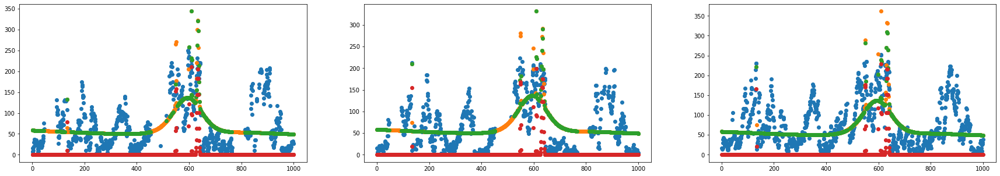

1th additional rbflayer
1th additional RBFlayer 0th epoch loss: 38.72545461748057
1th additional RBFlayer 999th epoch MSE Loss: 41.463216941324866
1th additional RBFlayer 1999th epoch MSE Loss: 40.025787412089144
1th additional RBFlayer 2999th epoch MSE Loss: 38.9328672494343
1th additional RBFlayer best loss : 38.72545461748057


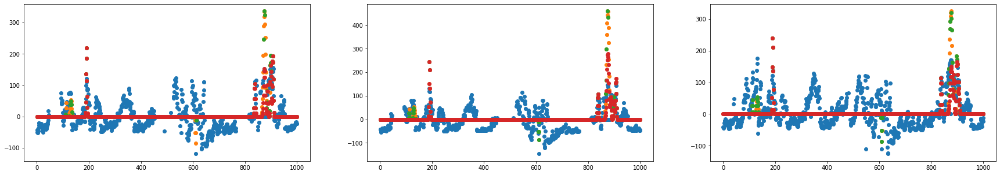

2th additional rbflayer
2th additional RBFlayer 0th epoch loss: 36.08722162080855
2th additional RBFlayer 999th epoch MSE Loss: 35.267475951797536
2th additional RBFlayer 1999th epoch MSE Loss: 32.424504765947944
2th additional RBFlayer 2999th epoch MSE Loss: 34.579866279527494
2th additional RBFlayer best loss : 31.397279731631315


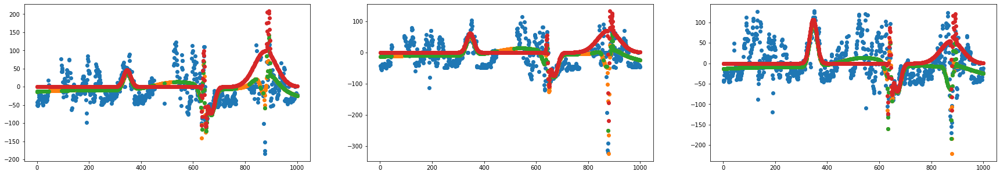

3th additional rbflayer
3th additional RBFlayer 0th epoch loss: 30.578230439193614
3th additional RBFlayer 999th epoch MSE Loss: 33.73772331485025
3th additional RBFlayer 1999th epoch MSE Loss: 32.20943831278696
3th additional RBFlayer 2999th epoch MSE Loss: 31.26901313829088
3th additional RBFlayer best loss : 30.578230439193614


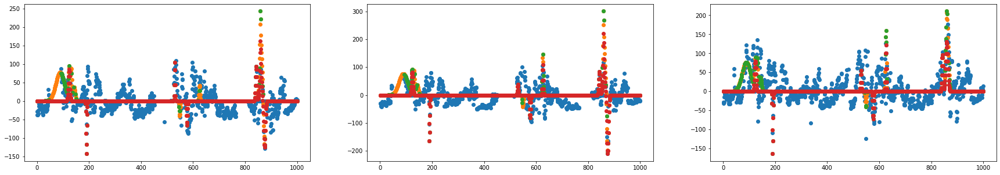

4th additional rbflayer
4th additional RBFlayer 0th epoch loss: 30.60396429118056
4th additional RBFlayer 999th epoch MSE Loss: 31.13283252953891
4th additional RBFlayer 1999th epoch MSE Loss: 30.06119825683422
4th additional RBFlayer 2999th epoch MSE Loss: 28.955196241453173
4th additional RBFlayer best loss : 28.955196241453173
change lr  0.01
----------------------------------------------


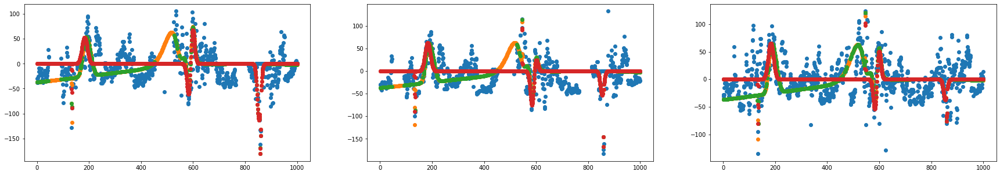

5th additional rbflayer
5th additional RBFlayer 0th epoch loss: 27.26546345554456
5th additional RBFlayer 999th epoch MSE Loss: 25.813141865749188
5th additional RBFlayer 1999th epoch MSE Loss: 24.911590784254994
5th additional RBFlayer 2999th epoch MSE Loss: 24.241156358338884
5th additional RBFlayer best loss : 24.241156358338884


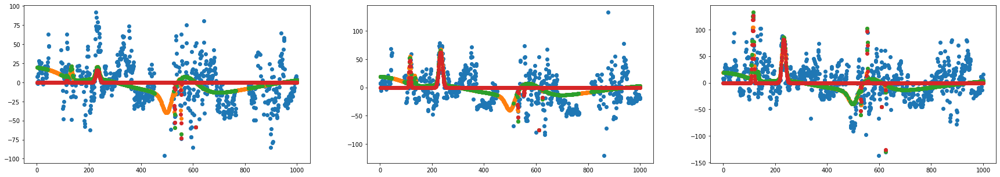

6th additional rbflayer
6th additional RBFlayer 0th epoch loss: 21.399648773784186
6th additional RBFlayer 999th epoch MSE Loss: 21.3800000870252
6th additional RBFlayer 1999th epoch MSE Loss: 20.798755594304115
6th additional RBFlayer 2999th epoch MSE Loss: 20.562296817063793
6th additional RBFlayer best loss : 20.523876209780585


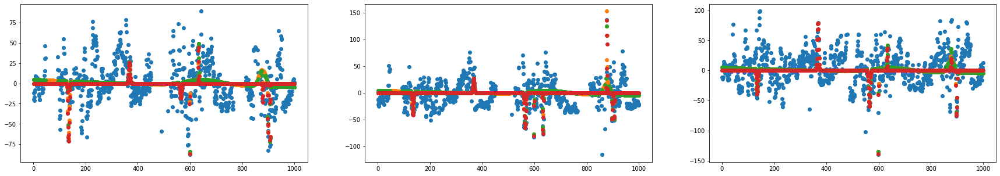

7th additional rbflayer
7th additional RBFlayer 0th epoch loss: 19.779092997517367
7th additional RBFlayer 999th epoch MSE Loss: 18.970090152402115
7th additional RBFlayer 1999th epoch MSE Loss: 18.051469397513255
7th additional RBFlayer 2999th epoch MSE Loss: 17.879187893901136
7th additional RBFlayer best loss : 17.56534100035729


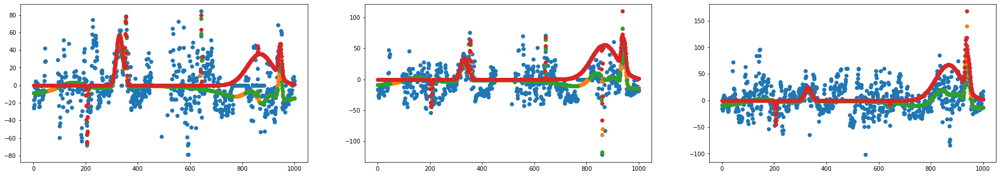

8th additional rbflayer
8th additional RBFlayer 0th epoch loss: 22.67413654874372
8th additional RBFlayer 999th epoch MSE Loss: 16.73931011225686
8th additional RBFlayer 1999th epoch MSE Loss: 16.89028870889455
8th additional RBFlayer 2999th epoch MSE Loss: 16.20229240545623
8th additional RBFlayer best loss : 16.20229240545623


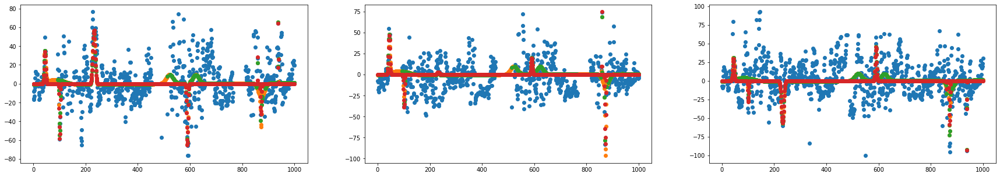

9th additional rbflayer
9th additional RBFlayer 0th epoch loss: 17.932471869515442
9th additional RBFlayer 999th epoch MSE Loss: 16.195007282086248
9th additional RBFlayer 1999th epoch MSE Loss: 15.520977573284958
9th additional RBFlayer 2999th epoch MSE Loss: 15.462307197257648
9th additional RBFlayer best loss : 15.462307197257648


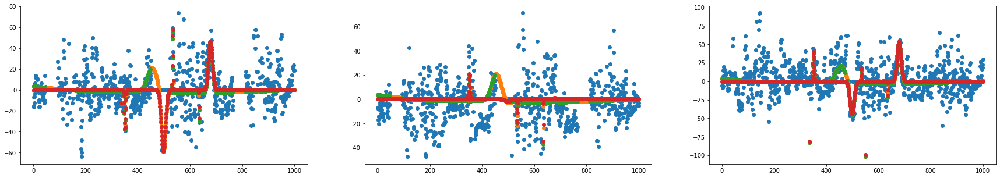

10th additional rbflayer
10th additional RBFlayer 0th epoch loss: 17.694665400811036
10th additional RBFlayer 999th epoch MSE Loss: 14.267115681150074
10th additional RBFlayer 1999th epoch MSE Loss: 13.91552992072513
10th additional RBFlayer 2999th epoch MSE Loss: 13.935478224782111
10th additional RBFlayer best loss : 13.915489231139539


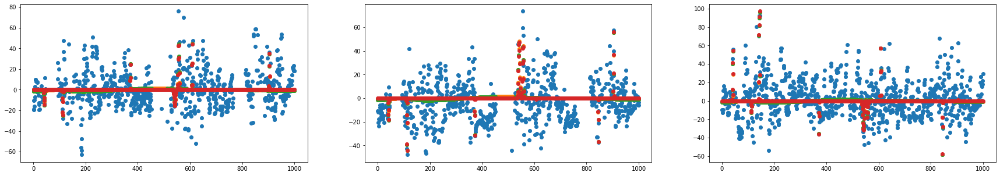

11th additional rbflayer
11th additional RBFlayer 0th epoch loss: 16.157339903384475
11th additional RBFlayer 999th epoch MSE Loss: 14.025564938388534
11th additional RBFlayer 1999th epoch MSE Loss: 13.384554540263645
11th additional RBFlayer 2999th epoch MSE Loss: 13.243831226468078
11th additional RBFlayer best loss : 13.243831226468078


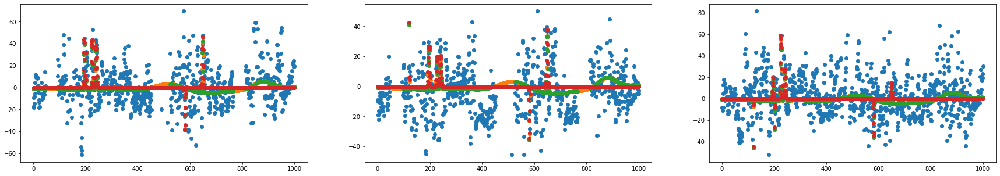

12th additional rbflayer
12th additional RBFlayer 0th epoch loss: 14.037069369757196
12th additional RBFlayer 999th epoch MSE Loss: 12.915772234353721
12th additional RBFlayer 1999th epoch MSE Loss: 12.465732891870129
12th additional RBFlayer 2999th epoch MSE Loss: 12.367631125671291
12th additional RBFlayer best loss : 12.36718118612863


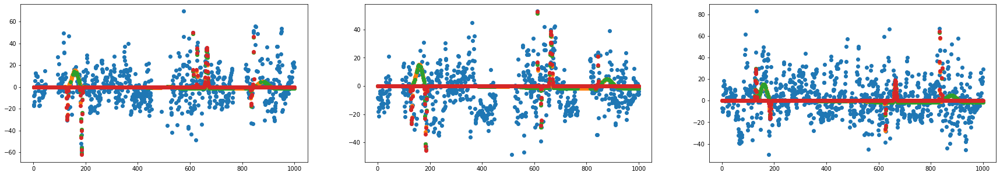

13th additional rbflayer
13th additional RBFlayer 0th epoch loss: 14.039539156614618
13th additional RBFlayer 999th epoch MSE Loss: 13.911766592611905
13th additional RBFlayer 1999th epoch MSE Loss: 13.148866361298092
13th additional RBFlayer 2999th epoch MSE Loss: 13.139509172603901
13th additional RBFlayer best loss : 13.131261007630343


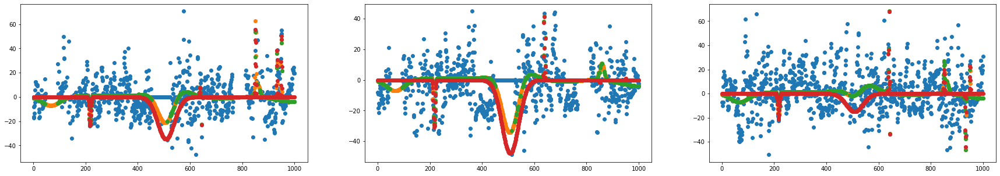

14th additional rbflayer
14th additional RBFlayer 0th epoch loss: 13.976051950712876
14th additional RBFlayer 999th epoch MSE Loss: 11.26388921646373
14th additional RBFlayer 1999th epoch MSE Loss: 11.208047715140045
14th additional RBFlayer 2999th epoch MSE Loss: 11.186057744299184
14th additional RBFlayer best loss : 11.186057744299184


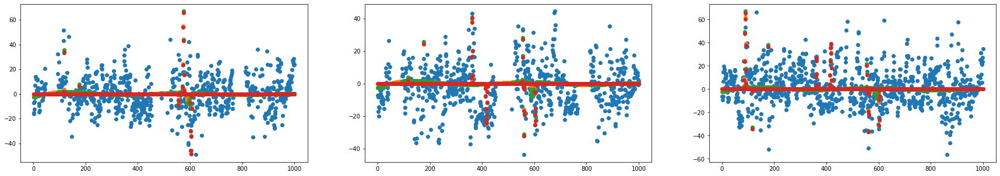

15th additional rbflayer
15th additional RBFlayer 0th epoch loss: 13.762925934916312
15th additional RBFlayer 999th epoch MSE Loss: 12.140543088960879
15th additional RBFlayer 1999th epoch MSE Loss: 11.74955223946955
15th additional RBFlayer 2999th epoch MSE Loss: 11.493452646631722
15th additional RBFlayer best loss : 11.493452646631722


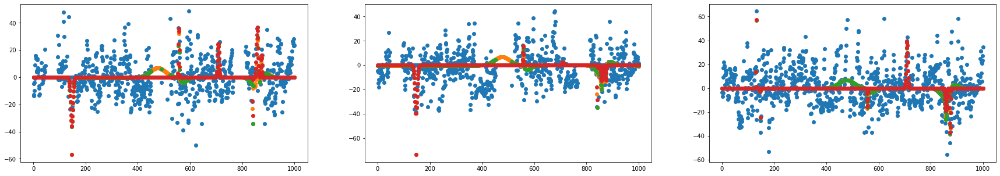

16th additional rbflayer
16th additional RBFlayer 0th epoch loss: 11.534110665482697
16th additional RBFlayer 999th epoch MSE Loss: 10.989106256665412
16th additional RBFlayer 1999th epoch MSE Loss: 10.956263878649862
16th additional RBFlayer 2999th epoch MSE Loss: 10.925488643067627
16th additional RBFlayer best loss : 10.925488643067627


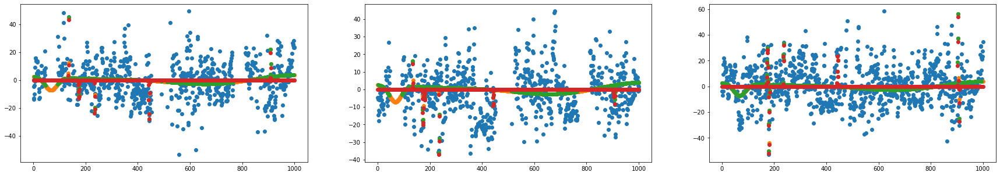

17th additional rbflayer
17th additional RBFlayer 0th epoch loss: 13.112927589922334
17th additional RBFlayer 999th epoch MSE Loss: 11.30077921855304
17th additional RBFlayer 1999th epoch MSE Loss: 10.993492296813715
17th additional RBFlayer 2999th epoch MSE Loss: 10.77726199596513
17th additional RBFlayer best loss : 10.77726199596513


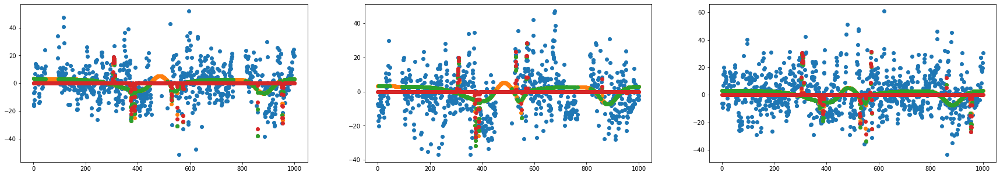

18th additional rbflayer
18th additional RBFlayer 0th epoch loss: 12.588334058312554
18th additional RBFlayer 999th epoch MSE Loss: 11.785204195408138
18th additional RBFlayer 1999th epoch MSE Loss: 10.290843534767644
18th additional RBFlayer 2999th epoch MSE Loss: 10.098321888821365
18th additional RBFlayer best loss : 10.098321888821365


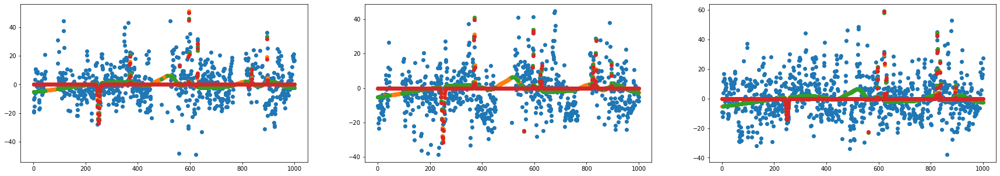

19th additional rbflayer
19th additional RBFlayer 0th epoch loss: 10.231623931292676
19th additional RBFlayer 999th epoch MSE Loss: 10.140195173923935
19th additional RBFlayer 1999th epoch MSE Loss: 9.669427524234408
19th additional RBFlayer 2999th epoch MSE Loss: 9.517318945924657
19th additional RBFlayer best loss : 9.517318945924657


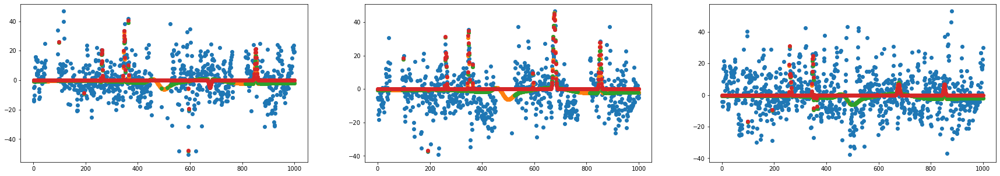

20th additional rbflayer
20th additional RBFlayer 0th epoch loss: 11.103880779582143
20th additional RBFlayer 999th epoch MSE Loss: 9.130441885830027
20th additional RBFlayer 1999th epoch MSE Loss: 9.050037907289813
20th additional RBFlayer 2999th epoch MSE Loss: 9.046160613040202
20th additional RBFlayer best loss : 9.044463703870049


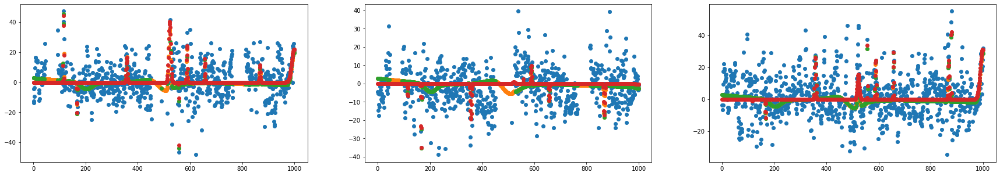

21th additional rbflayer
21th additional RBFlayer 0th epoch loss: 10.280102309757297
21th additional RBFlayer 999th epoch MSE Loss: 8.73839719355975
21th additional RBFlayer 1999th epoch MSE Loss: 8.635847585417427
21th additional RBFlayer 2999th epoch MSE Loss: 8.658549512700272
21th additional RBFlayer best loss : 8.627964691698812


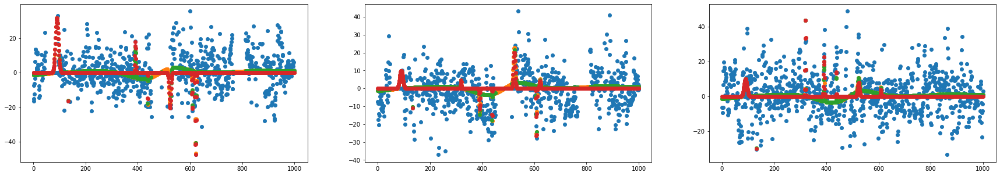

22th additional rbflayer
22th additional RBFlayer 0th epoch loss: 10.102565651278416
22th additional RBFlayer 999th epoch MSE Loss: 8.533355455042665
22th additional RBFlayer 1999th epoch MSE Loss: 8.413798244708268
22th additional RBFlayer 2999th epoch MSE Loss: 8.360254213937006
22th additional RBFlayer best loss : 8.360254213937006


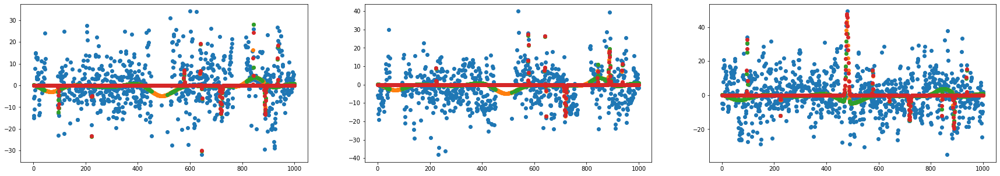

23th additional rbflayer
23th additional RBFlayer 0th epoch loss: 9.073620409401498
23th additional RBFlayer 999th epoch MSE Loss: 8.415738584037484
23th additional RBFlayer 1999th epoch MSE Loss: 8.091718943847368
23th additional RBFlayer 2999th epoch MSE Loss: 7.942517565700595
23th additional RBFlayer best loss : 7.86162304942636


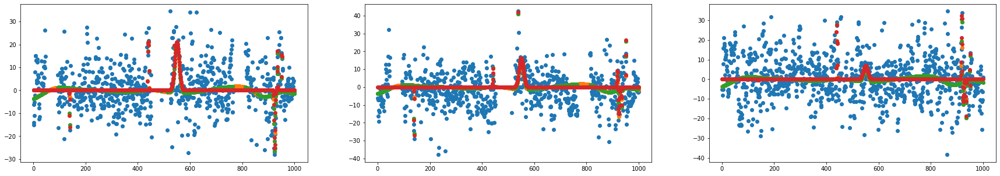

24th additional rbflayer
24th additional RBFlayer 0th epoch loss: 9.031925052965365
24th additional RBFlayer 999th epoch MSE Loss: 7.856792313202101
24th additional RBFlayer 1999th epoch MSE Loss: 7.573259317989388
24th additional RBFlayer 2999th epoch MSE Loss: 7.517177314233224
24th additional RBFlayer best loss : 7.517177314233224


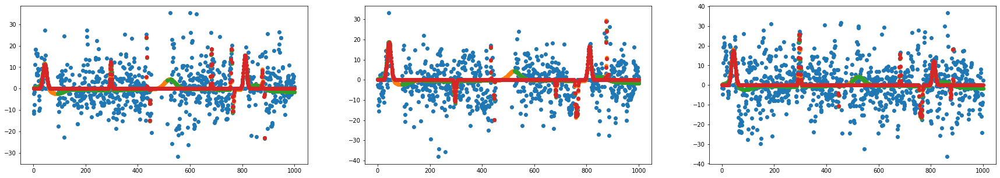

25th additional rbflayer
25th additional RBFlayer 0th epoch loss: 9.323802047917102
25th additional RBFlayer 999th epoch MSE Loss: 7.917563885032709
25th additional RBFlayer 1999th epoch MSE Loss: 7.216095106161011
25th additional RBFlayer 2999th epoch MSE Loss: 7.086913870961521
25th additional RBFlayer best loss : 7.086913870961521


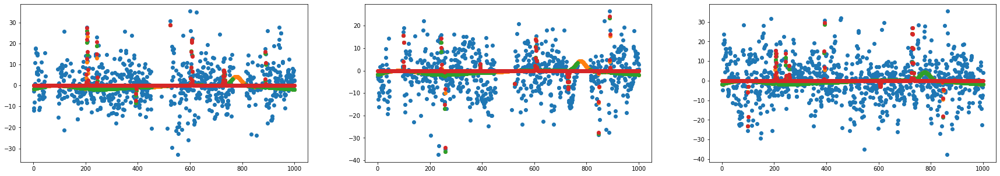

26th additional rbflayer
26th additional RBFlayer 0th epoch loss: 7.888093984812782
26th additional RBFlayer 999th epoch MSE Loss: 7.311040039783587
26th additional RBFlayer 1999th epoch MSE Loss: 6.954077548095141
26th additional RBFlayer 2999th epoch MSE Loss: 6.8542045432678425
26th additional RBFlayer best loss : 6.8542045432678425


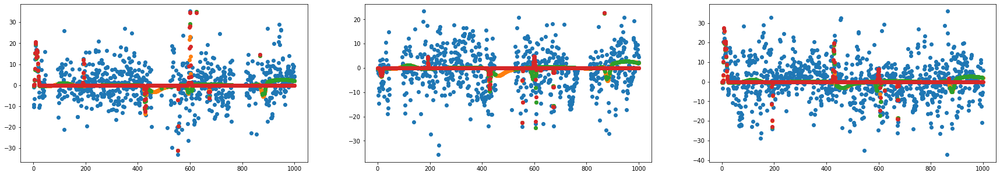

27th additional rbflayer
27th additional RBFlayer 0th epoch loss: 7.9942167481684505
27th additional RBFlayer 999th epoch MSE Loss: 7.135797719462192
27th additional RBFlayer 1999th epoch MSE Loss: 6.693383614135459
27th additional RBFlayer 2999th epoch MSE Loss: 6.61796928946321
27th additional RBFlayer best loss : 6.61796928946321


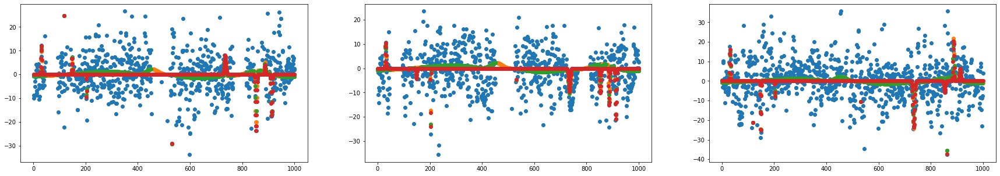

28th additional rbflayer
28th additional RBFlayer 0th epoch loss: 7.57410386075942
28th additional RBFlayer 999th epoch MSE Loss: 6.941372888016732
28th additional RBFlayer 1999th epoch MSE Loss: 6.743267270840802
28th additional RBFlayer 2999th epoch MSE Loss: 6.617882152405629
28th additional RBFlayer best loss : 6.617882152405629


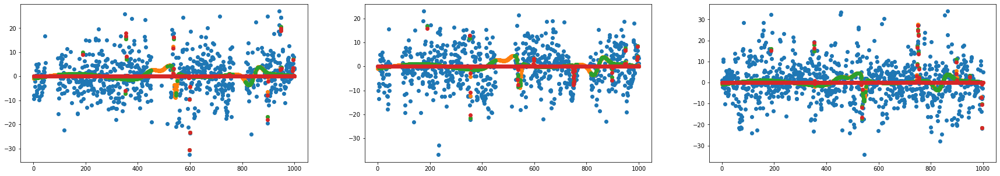

29th additional rbflayer
29th additional RBFlayer 0th epoch loss: 7.915833427242654
29th additional RBFlayer 999th epoch MSE Loss: 7.099545556482133
29th additional RBFlayer 1999th epoch MSE Loss: 6.377391182630603
29th additional RBFlayer 2999th epoch MSE Loss: 6.333013660675317
29th additional RBFlayer best loss : 6.291345848050605


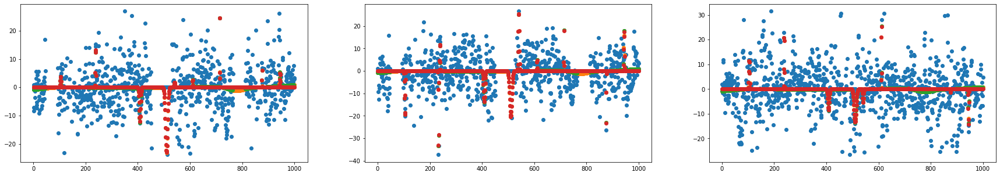

30th additional rbflayer
30th additional RBFlayer 0th epoch loss: 6.863302481395991
30th additional RBFlayer 999th epoch MSE Loss: 6.392637134086217
30th additional RBFlayer 1999th epoch MSE Loss: 6.140034360363165
30th additional RBFlayer 2999th epoch MSE Loss: 6.047255917169099
30th additional RBFlayer best loss : 6.047255917169099


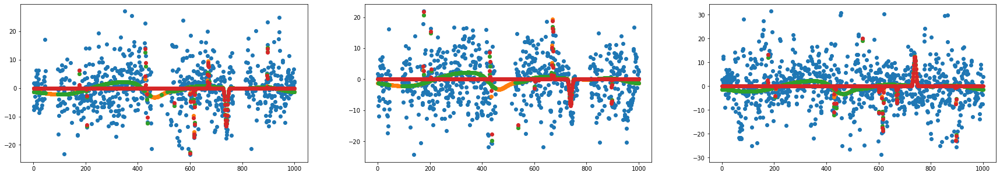

31th additional rbflayer
31th additional RBFlayer 0th epoch loss: 7.949986209688906
31th additional RBFlayer 999th epoch MSE Loss: 7.08790606845824
31th additional RBFlayer 1999th epoch MSE Loss: 6.493751500595881
31th additional RBFlayer 2999th epoch MSE Loss: 6.326845502504613
31th additional RBFlayer best loss : 6.326845502504613


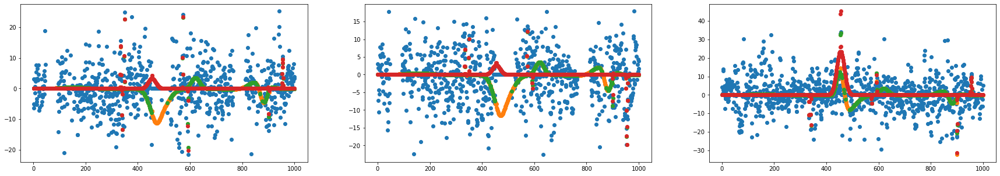

32th additional rbflayer
32th additional RBFlayer 0th epoch loss: 7.501966785957091
32th additional RBFlayer 999th epoch MSE Loss: 6.66928176366587
32th additional RBFlayer 1999th epoch MSE Loss: 6.420980982735818
32th additional RBFlayer 2999th epoch MSE Loss: 6.306859600157852
32th additional RBFlayer best loss : 6.306859600157852


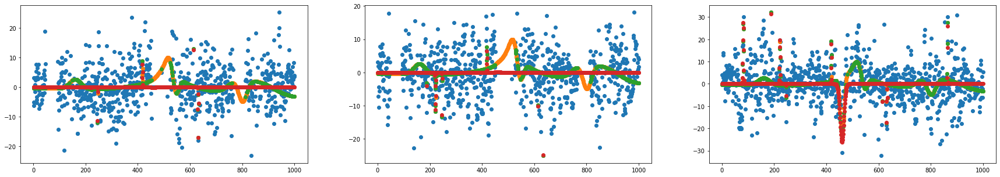

33th additional rbflayer
33th additional RBFlayer 0th epoch loss: 6.946746662645431
33th additional RBFlayer 999th epoch MSE Loss: 5.995770686070341
33th additional RBFlayer 1999th epoch MSE Loss: 5.937841494942274
33th additional RBFlayer 2999th epoch MSE Loss: 5.82690918079171
33th additional RBFlayer best loss : 5.82690918079171


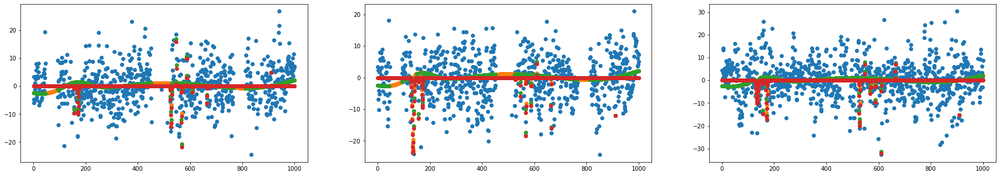

34th additional rbflayer
34th additional RBFlayer 0th epoch loss: 7.165649342745702
34th additional RBFlayer 999th epoch MSE Loss: 6.293493693013007
34th additional RBFlayer 1999th epoch MSE Loss: 6.0406130961516125
34th additional RBFlayer 2999th epoch MSE Loss: 5.866885272648736
34th additional RBFlayer best loss : 5.866885272648736


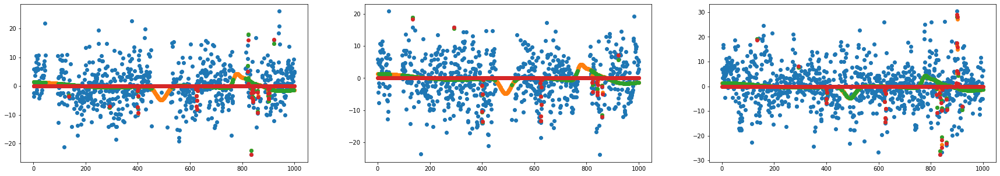

35th additional rbflayer
35th additional RBFlayer 0th epoch loss: 6.280882612655564
35th additional RBFlayer 999th epoch MSE Loss: 5.726345296851363
35th additional RBFlayer 1999th epoch MSE Loss: 5.589886095543759
35th additional RBFlayer 2999th epoch MSE Loss: 5.563022283028537
35th additional RBFlayer best loss : 5.563022283028537


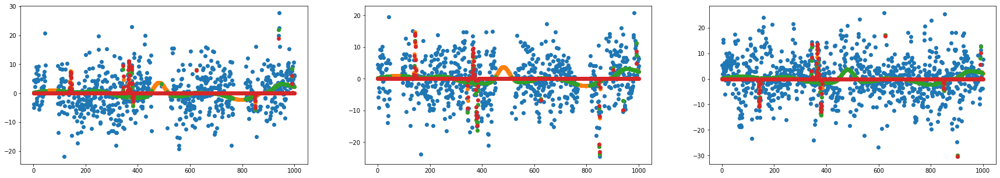

36th additional rbflayer
36th additional RBFlayer 0th epoch loss: 6.496604200731342
36th additional RBFlayer 999th epoch MSE Loss: 5.419664978554593
36th additional RBFlayer 1999th epoch MSE Loss: 5.255900727876473
36th additional RBFlayer 2999th epoch MSE Loss: 5.314233718901206
36th additional RBFlayer best loss : 5.2236602231274905


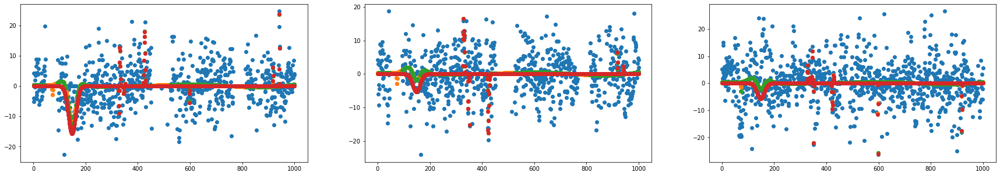

37th additional rbflayer
37th additional RBFlayer 0th epoch loss: 6.157036455974968
37th additional RBFlayer 999th epoch MSE Loss: 5.907275705438007
37th additional RBFlayer 1999th epoch MSE Loss: 5.429795571996622
37th additional RBFlayer 2999th epoch MSE Loss: 5.255095818710342
37th additional RBFlayer best loss : 5.255095818710342


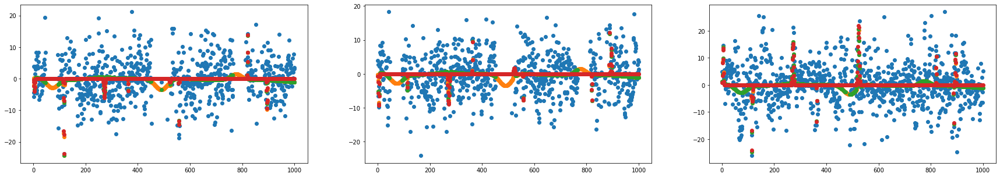

38th additional rbflayer
38th additional RBFlayer 0th epoch loss: 6.056664584712724
38th additional RBFlayer 999th epoch MSE Loss: 5.5375785182528645
38th additional RBFlayer 1999th epoch MSE Loss: 5.113907622878488
38th additional RBFlayer 2999th epoch MSE Loss: 4.960383919836778
38th additional RBFlayer best loss : 4.960383919836778


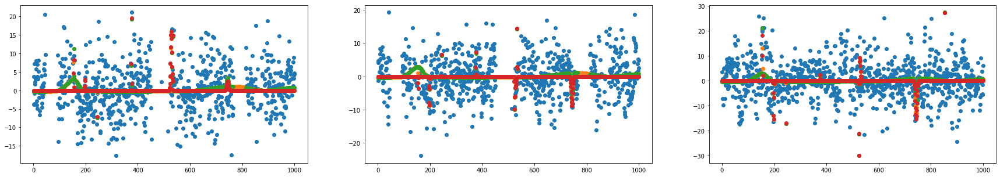

39th additional rbflayer
39th additional RBFlayer 0th epoch loss: 6.102329197395918
39th additional RBFlayer 999th epoch MSE Loss: 5.4049563537074645
39th additional RBFlayer 1999th epoch MSE Loss: 5.263073573551471
39th additional RBFlayer 2999th epoch MSE Loss: 5.181558530454639
39th additional RBFlayer best loss : 5.181558530454639


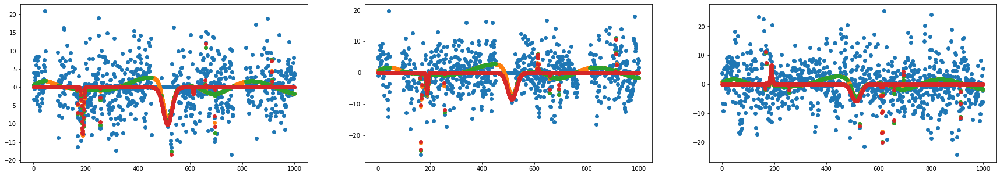

40th additional rbflayer
40th additional RBFlayer 0th epoch loss: 6.079799732776495
40th additional RBFlayer 999th epoch MSE Loss: 5.198469498418996
40th additional RBFlayer 1999th epoch MSE Loss: 5.040296310931958
40th additional RBFlayer 2999th epoch MSE Loss: 4.854215659560135
40th additional RBFlayer best loss : 4.854215659560135


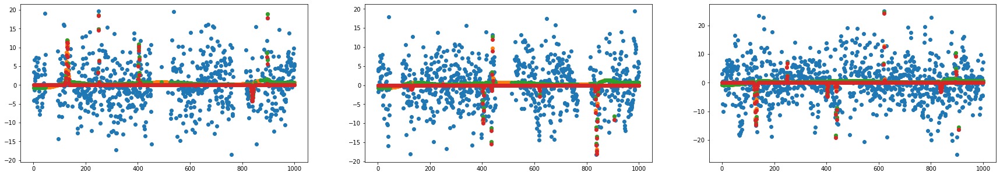

41th additional rbflayer
41th additional RBFlayer 0th epoch loss: 5.567602507835
41th additional RBFlayer 999th epoch MSE Loss: 5.0106841118400105
41th additional RBFlayer 1999th epoch MSE Loss: 4.848144744118418
41th additional RBFlayer 2999th epoch MSE Loss: 4.776629895658229
41th additional RBFlayer best loss : 4.748965487704923


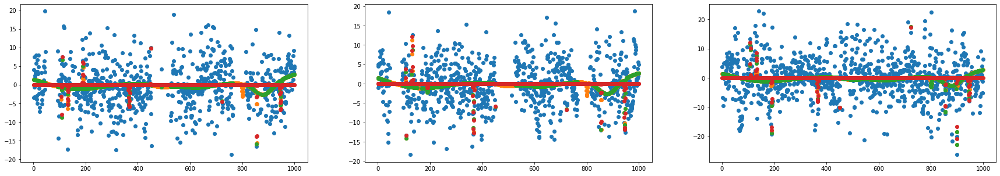

42th additional rbflayer
42th additional RBFlayer 0th epoch loss: 5.517842447637847
42th additional RBFlayer 999th epoch MSE Loss: 4.9278316358996115
42th additional RBFlayer 1999th epoch MSE Loss: 4.776812634096105
42th additional RBFlayer 2999th epoch MSE Loss: 4.700365585719788
42th additional RBFlayer best loss : 4.700365585719788


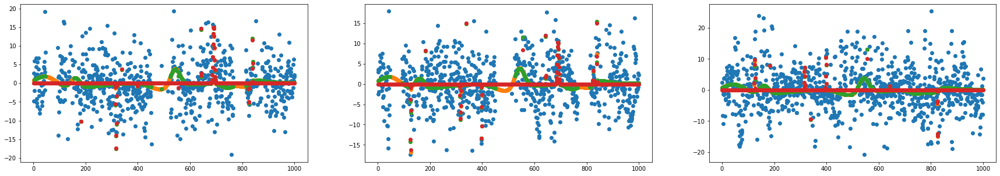

43th additional rbflayer
43th additional RBFlayer 0th epoch loss: 5.224804197301478
43th additional RBFlayer 999th epoch MSE Loss: 4.854628769051256
43th additional RBFlayer 1999th epoch MSE Loss: 4.672685282562323
43th additional RBFlayer 2999th epoch MSE Loss: 4.564896753026707
43th additional RBFlayer best loss : 4.564896753026707


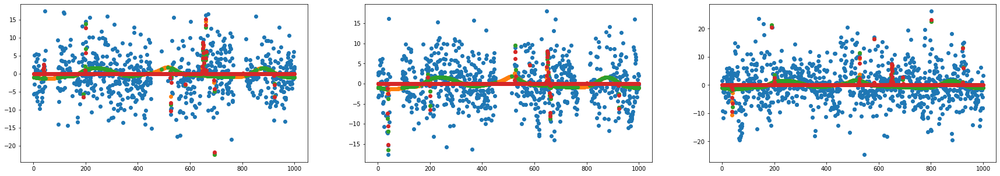

44th additional rbflayer
44th additional RBFlayer 0th epoch loss: 5.3743586714447
44th additional RBFlayer 999th epoch MSE Loss: 4.7136439639722365
44th additional RBFlayer 1999th epoch MSE Loss: 4.491813922047114
44th additional RBFlayer 2999th epoch MSE Loss: 4.43473873828546
44th additional RBFlayer best loss : 4.43473873828546


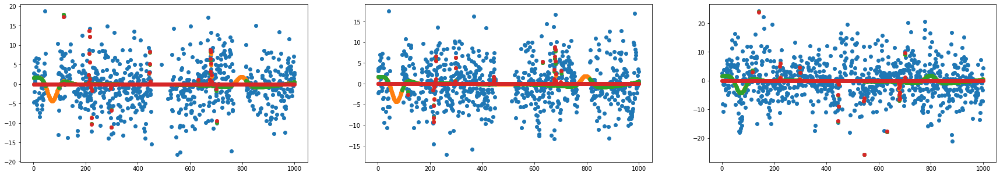

45th additional rbflayer
45th additional RBFlayer 0th epoch loss: 5.287148205612678
45th additional RBFlayer 999th epoch MSE Loss: 4.693331701639162
45th additional RBFlayer 1999th epoch MSE Loss: 4.4962456756301155
45th additional RBFlayer 2999th epoch MSE Loss: 4.515213037947012
45th additional RBFlayer best loss : 4.494082313323554


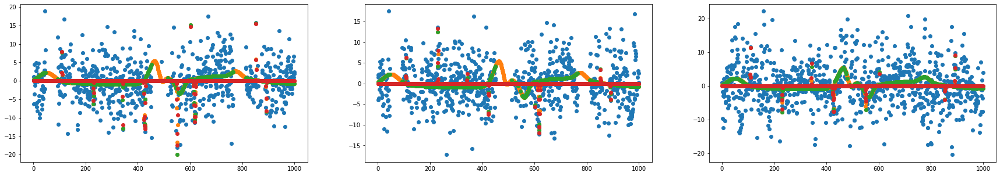

46th additional rbflayer
46th additional RBFlayer 0th epoch loss: 4.8683583118613125
46th additional RBFlayer 999th epoch MSE Loss: 5.009914346873192
46th additional RBFlayer 1999th epoch MSE Loss: 4.43925077754312
46th additional RBFlayer 2999th epoch MSE Loss: 4.377805443143988
46th additional RBFlayer best loss : 4.377805443143988


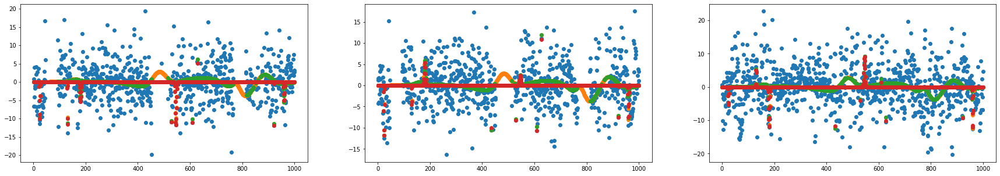

47th additional rbflayer
47th additional RBFlayer 0th epoch loss: 5.669872567097942
47th additional RBFlayer 999th epoch MSE Loss: 4.6813068591830636
47th additional RBFlayer 1999th epoch MSE Loss: 4.529275754600848
47th additional RBFlayer 2999th epoch MSE Loss: 4.488339499287368
47th additional RBFlayer best loss : 4.488339499287368


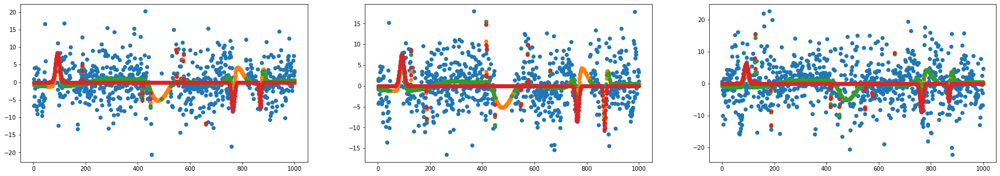

48th additional rbflayer
48th additional RBFlayer 0th epoch loss: 5.399559972731478
48th additional RBFlayer 999th epoch MSE Loss: 4.19050587775828
48th additional RBFlayer 1999th epoch MSE Loss: 4.096579967948165
48th additional RBFlayer 2999th epoch MSE Loss: 4.057833924893686
48th additional RBFlayer best loss : 4.054935768586879


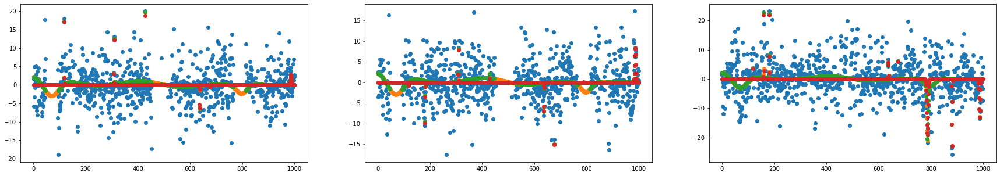

49th additional rbflayer
49th additional RBFlayer 0th epoch loss: 4.948942440485345
49th additional RBFlayer 999th epoch MSE Loss: 4.28468858122444
49th additional RBFlayer 1999th epoch MSE Loss: 4.132603139460398
49th additional RBFlayer 2999th epoch MSE Loss: 4.05836135678748
49th additional RBFlayer best loss : 4.05836135678748


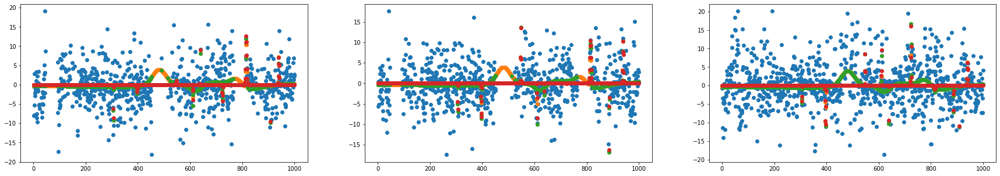

50th additional rbflayer
50th additional RBFlayer 0th epoch loss: 4.85937042465539
50th additional RBFlayer 999th epoch MSE Loss: 4.207318868467239
50th additional RBFlayer 1999th epoch MSE Loss: 4.01866202895433
50th additional RBFlayer 2999th epoch MSE Loss: 3.9748574408764785
50th additional RBFlayer best loss : 3.9748574408764785


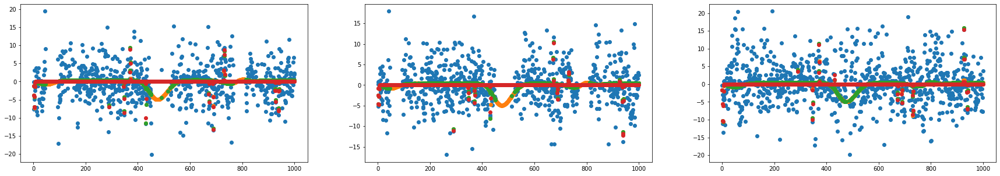

51th additional rbflayer
51th additional RBFlayer 0th epoch loss: 5.025239084596901
51th additional RBFlayer 999th epoch MSE Loss: 4.224138827328388
51th additional RBFlayer 1999th epoch MSE Loss: 3.902522782976414
51th additional RBFlayer 2999th epoch MSE Loss: 3.8230568267451677
51th additional RBFlayer best loss : 3.8230568267451677


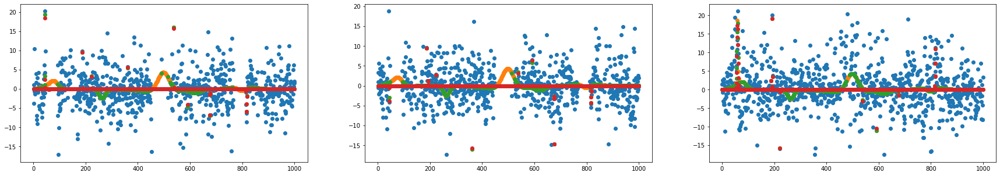

52th additional rbflayer
52th additional RBFlayer 0th epoch loss: 4.119732664024726
52th additional RBFlayer 999th epoch MSE Loss: 3.703393510193661
52th additional RBFlayer 1999th epoch MSE Loss: 3.8439962316559626
52th additional RBFlayer 2999th epoch MSE Loss: 3.7982691262642145
52th additional RBFlayer best loss : 3.6970583682059277


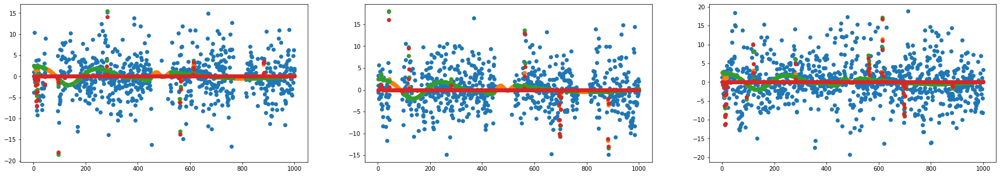

53th additional rbflayer
53th additional RBFlayer 0th epoch loss: 4.275963579748815
53th additional RBFlayer 999th epoch MSE Loss: 3.9378560723248586
53th additional RBFlayer 1999th epoch MSE Loss: 3.80305736477106
53th additional RBFlayer 2999th epoch MSE Loss: 3.726405110517898
53th additional RBFlayer best loss : 3.726405110517898


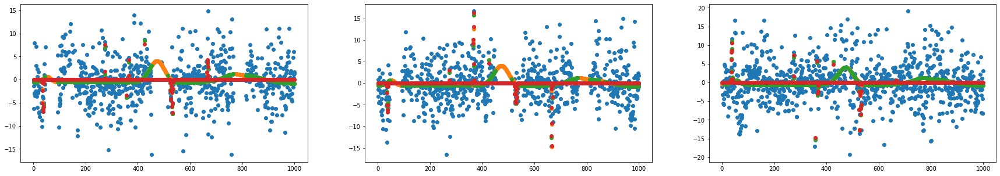

54th additional rbflayer
54th additional RBFlayer 0th epoch loss: 4.446012394519304
54th additional RBFlayer 999th epoch MSE Loss: 3.7841934899263743
54th additional RBFlayer 1999th epoch MSE Loss: 3.6413879614677915
54th additional RBFlayer 2999th epoch MSE Loss: 3.5462197457202294
54th additional RBFlayer best loss : 3.5462197457202294


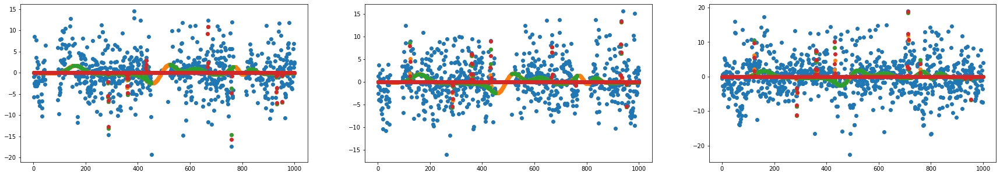

55th additional rbflayer
55th additional RBFlayer 0th epoch loss: 5.0403653106544555
55th additional RBFlayer 999th epoch MSE Loss: 4.166403922990112
55th additional RBFlayer 1999th epoch MSE Loss: 3.9247594632078413
55th additional RBFlayer 2999th epoch MSE Loss: 3.7283028111618304
55th additional RBFlayer best loss : 3.7283028111618304


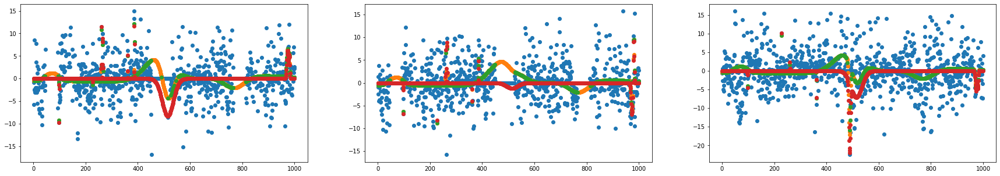

56th additional rbflayer
56th additional RBFlayer 0th epoch loss: 4.848516584936278
56th additional RBFlayer 999th epoch MSE Loss: 4.114484353962479
56th additional RBFlayer 1999th epoch MSE Loss: 3.8219867044766866
56th additional RBFlayer 2999th epoch MSE Loss: 3.7548496801602913
56th additional RBFlayer best loss : 3.7548496801602913


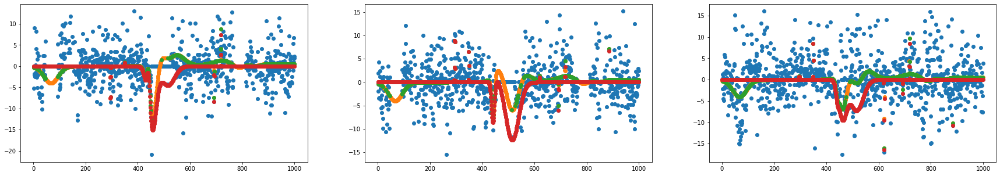

57th additional rbflayer
57th additional RBFlayer 0th epoch loss: 3.7868971692289612
57th additional RBFlayer 999th epoch MSE Loss: 3.633977525915825
57th additional RBFlayer 1999th epoch MSE Loss: 3.5227577956830607
57th additional RBFlayer 2999th epoch MSE Loss: 3.470371216712008
57th additional RBFlayer best loss : 3.470371216712008


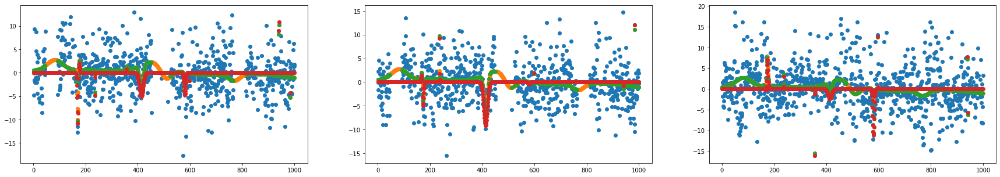

58th additional rbflayer
58th additional RBFlayer 0th epoch loss: 4.110912772237424
58th additional RBFlayer 999th epoch MSE Loss: 3.514448692701102
58th additional RBFlayer 1999th epoch MSE Loss: 3.493761939260116
58th additional RBFlayer 2999th epoch MSE Loss: 3.468411048680359
58th additional RBFlayer best loss : 3.468411048680359


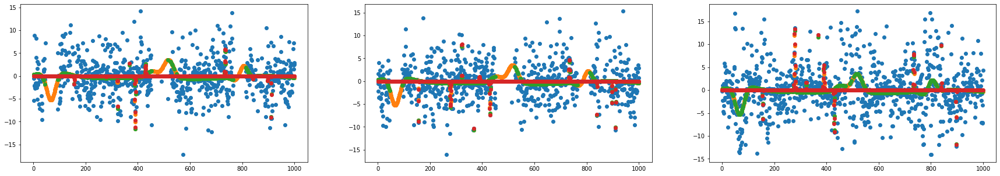

59th additional rbflayer
59th additional RBFlayer 0th epoch loss: 4.52485612473493
59th additional RBFlayer 999th epoch MSE Loss: 3.476398332797936
59th additional RBFlayer 1999th epoch MSE Loss: 3.3010327169128555
59th additional RBFlayer 2999th epoch MSE Loss: 3.262531532939199
59th additional RBFlayer best loss : 3.262531532939199


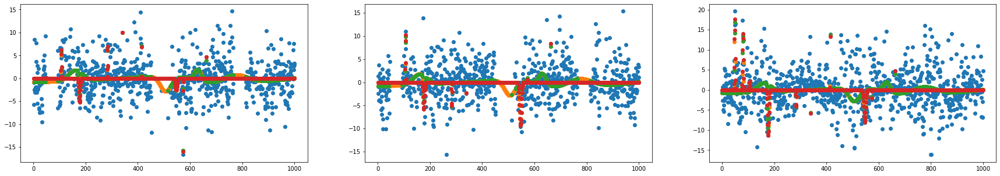

60th additional rbflayer
60th additional RBFlayer 0th epoch loss: 4.116268064071288
60th additional RBFlayer 999th epoch MSE Loss: 3.4832619432533183
60th additional RBFlayer 1999th epoch MSE Loss: 3.28993050479998
60th additional RBFlayer 2999th epoch MSE Loss: 3.2052693314015754
60th additional RBFlayer best loss : 3.2052693314015754


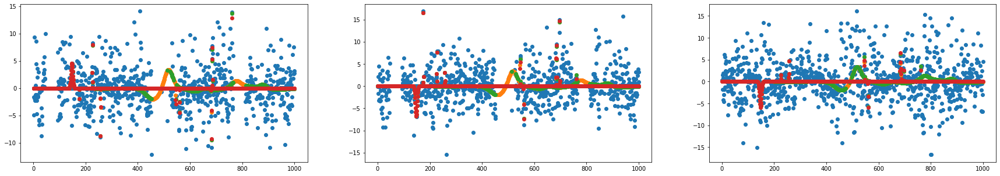

61th additional rbflayer
61th additional RBFlayer 0th epoch loss: 4.0578387515279974
61th additional RBFlayer 999th epoch MSE Loss: 3.437656691974428
61th additional RBFlayer 1999th epoch MSE Loss: 3.1551429999917855
61th additional RBFlayer 2999th epoch MSE Loss: 3.0922437382727335
61th additional RBFlayer best loss : 3.0922437382727335


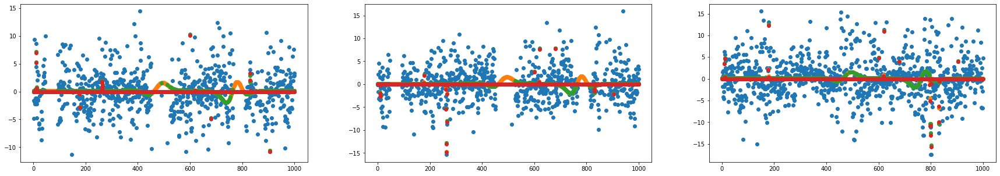

62th additional rbflayer
62th additional RBFlayer 0th epoch loss: 3.9287947648390187
62th additional RBFlayer 999th epoch MSE Loss: 3.586491465968954
62th additional RBFlayer 1999th epoch MSE Loss: 3.2636512862261196
62th additional RBFlayer 2999th epoch MSE Loss: 3.12443561283457
62th additional RBFlayer best loss : 3.122271131889999


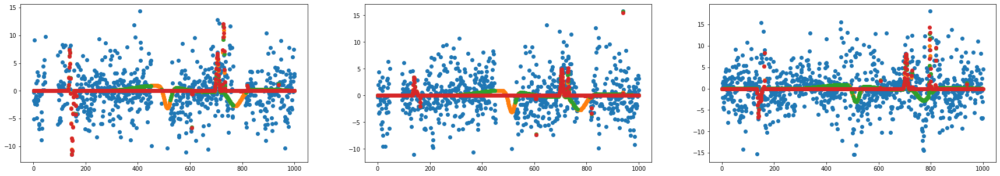

63th additional rbflayer
63th additional RBFlayer 0th epoch loss: 3.7343794408474533
63th additional RBFlayer 999th epoch MSE Loss: 3.13053790480803
63th additional RBFlayer 1999th epoch MSE Loss: 2.9369519157201394
63th additional RBFlayer 2999th epoch MSE Loss: 2.8846543385620076
63th additional RBFlayer best loss : 2.8846543385620076


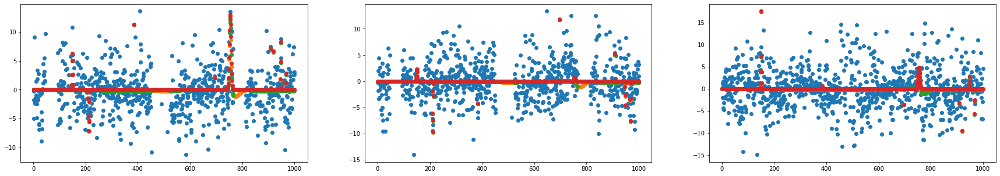

In [69]:
df = pd.read_csv("../dataset/pm25_missing.txt").drop(['datetime'], axis = 1)
df = df[df.columns[:3]].reset_index(drop=True)
target = torch.tensor(df.values).T.to(device).reshape(3,len(df))
input = torch.tensor(df.index + 1, dtype=float).to(device)
model = MultiRBFnnTime(3, 10, device)
model.train(input, target, 3000, 1e-3, 3, 30, 0.4)

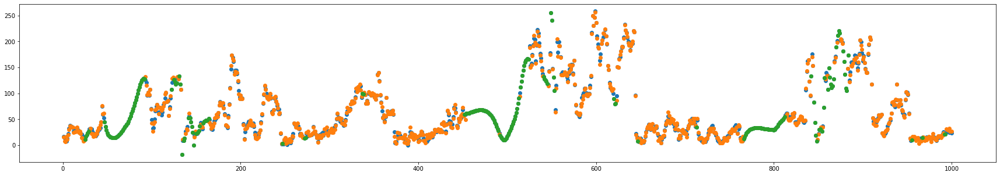

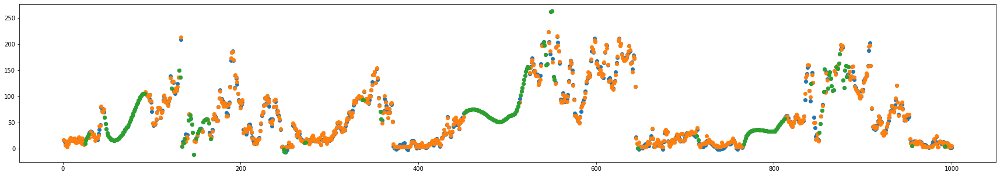

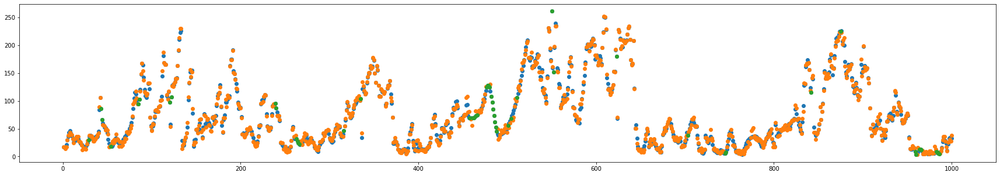

In [70]:
pred_ = model.pred(input)[1]
missing_index = torch.where(target.isnan(), 0.0, 1.0)
for i in range(3):
    plt.figure(figsize=(30,5))
    plt.scatter(input.cpu().detach().numpy(), pred_[i].cpu().detach().numpy())
    plt.scatter(input.cpu().detach().numpy(), target[i].cpu().detach().numpy())
    plt.scatter(input[missing_index[i] != 1].cpu().detach().numpy(), pred_[i][missing_index[i] != 1].cpu().detach().numpy())

In [71]:
real = pd.read_csv("./dataset/pm25_ground.txt").drop(['datetime'], axis = 1)
real = real[real.columns[:3]][1000:2000].reset_index(drop=True)
real_target = torch.tensor(real.values).T.to(device).reshape(3,len(real))

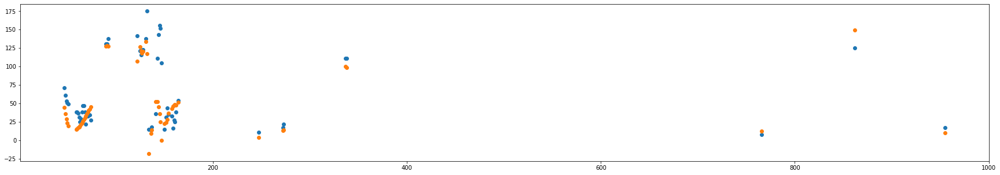

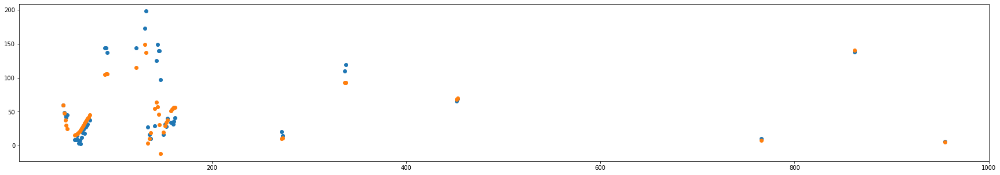

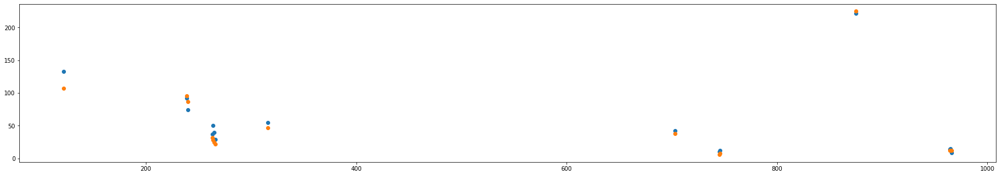

In [76]:
real_missing = torch.where(real_target.isnan(), 0.0, 1.0)
a = missing_index - real_missing
for i in range(3):
    plt.figure(figsize=(30,5))
    plt.scatter(input[a[i] != 0].cpu().detach().numpy(), real_target[i][a[i] != 0].cpu().detach().numpy())
    plt.scatter(input[a[i] != 0].cpu().detach().numpy(), pred_[i][a[i] != 0].cpu().detach().numpy())

In [79]:
torch.mean(torch.abs(real_target[a != 0] - pred_[a != 0]))

tensor(19.6179, device='cuda:0', dtype=torch.float64)

0th additional rbflayer
0th additional RBFlayer 0th epoch loss: 9653.660498710473
0th additional RBFlayer 999th epoch MSE Loss: 90.89267379756949
0th additional RBFlayer 1999th epoch MSE Loss: 82.63546285603154
0th additional RBFlayer 2999th epoch MSE Loss: 80.21547110561508
0th additional RBFlayer best loss : 80.21547110561508


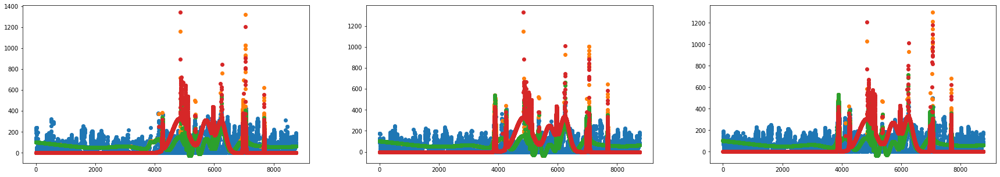

1th additional rbflayer
1th additional RBFlayer 0th epoch loss: 60.11888364096821
1th additional RBFlayer 999th epoch MSE Loss: 68.51477188599596
1th additional RBFlayer 1999th epoch MSE Loss: 61.30369681234417
1th additional RBFlayer 2999th epoch MSE Loss: 59.28498027029026
1th additional RBFlayer best loss : 58.834002679723085


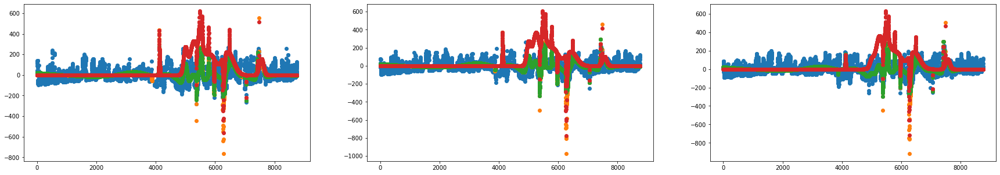

2th additional rbflayer
2th additional RBFlayer 0th epoch loss: 56.55474022523714
2th additional RBFlayer 999th epoch MSE Loss: 56.42011852849399
2th additional RBFlayer 1999th epoch MSE Loss: 51.486045640342475
2th additional RBFlayer 2999th epoch MSE Loss: 48.876872230497035
2th additional RBFlayer best loss : 48.874476374906415


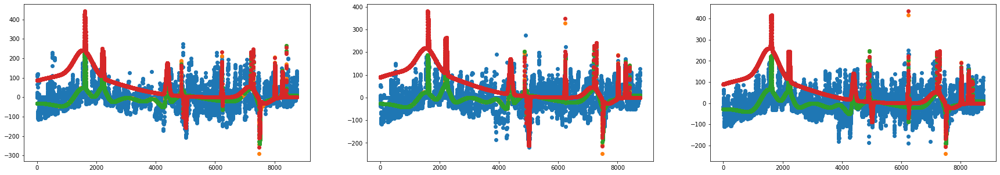

3th additional rbflayer
3th additional RBFlayer 0th epoch loss: 50.39933996110621
3th additional RBFlayer 999th epoch MSE Loss: 44.53161939964368
3th additional RBFlayer 1999th epoch MSE Loss: 44.41962563951659
3th additional RBFlayer 2999th epoch MSE Loss: 43.572888371591816
3th additional RBFlayer best loss : 43.572888371591816


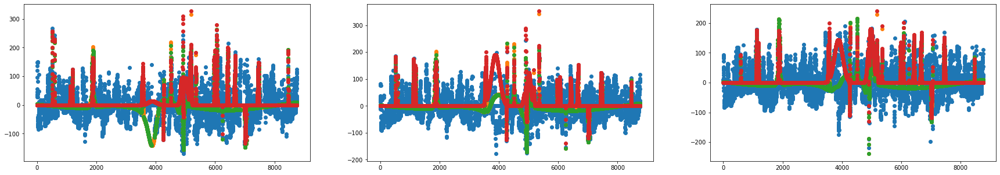

4th additional rbflayer
4th additional RBFlayer 0th epoch loss: 45.1753839756952
4th additional RBFlayer 999th epoch MSE Loss: 39.83346175115559
4th additional RBFlayer 1999th epoch MSE Loss: 38.17428073281795
4th additional RBFlayer 2999th epoch MSE Loss: 37.46688112900926
4th additional RBFlayer best loss : 37.46688112900926


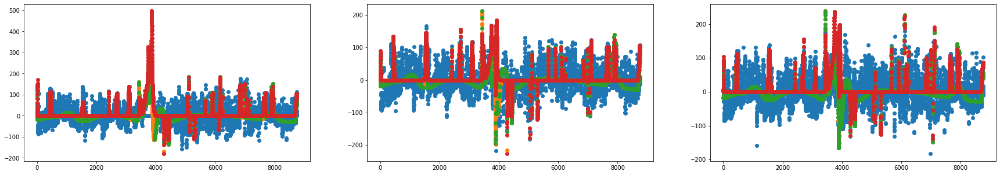

5th additional rbflayer
5th additional RBFlayer 0th epoch loss: 39.35479288861794
5th additional RBFlayer 999th epoch MSE Loss: 32.363839092662765
5th additional RBFlayer 1999th epoch MSE Loss: 31.46126704455192
5th additional RBFlayer 2999th epoch MSE Loss: 30.88074361666755
5th additional RBFlayer best loss : 30.88074361666755


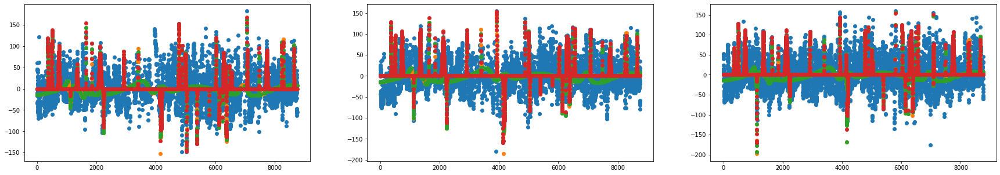

6th additional rbflayer
6th additional RBFlayer 0th epoch loss: 35.14445586959239
6th additional RBFlayer 999th epoch MSE Loss: 29.364992998143606
6th additional RBFlayer 1999th epoch MSE Loss: 27.811863251223876
6th additional RBFlayer 2999th epoch MSE Loss: 27.03879751831684
6th additional RBFlayer best loss : 27.03879751831684


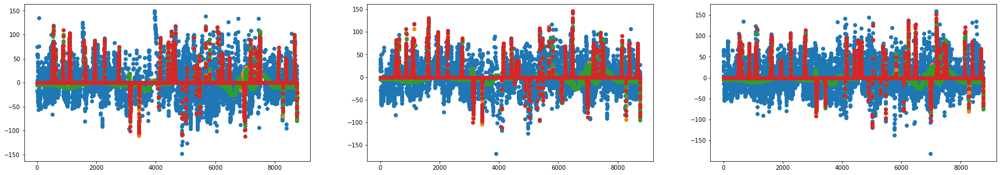

7th additional rbflayer
7th additional RBFlayer 0th epoch loss: 29.804468489384735
7th additional RBFlayer 999th epoch MSE Loss: 26.57596998188982
7th additional RBFlayer 1999th epoch MSE Loss: 25.28121332927623
7th additional RBFlayer 2999th epoch MSE Loss: 24.66152192767309
7th additional RBFlayer best loss : 24.66152192767309


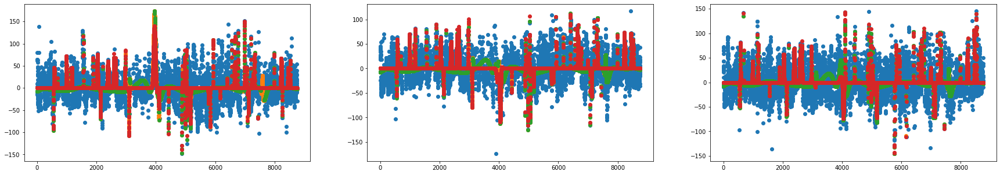

8th additional rbflayer
8th additional RBFlayer 0th epoch loss: 30.92829729576568
8th additional RBFlayer 999th epoch MSE Loss: 24.644725876163406
8th additional RBFlayer 1999th epoch MSE Loss: 24.201489665952497
8th additional RBFlayer 2999th epoch MSE Loss: 23.160831965594845
8th additional RBFlayer best loss : 23.160831965594845


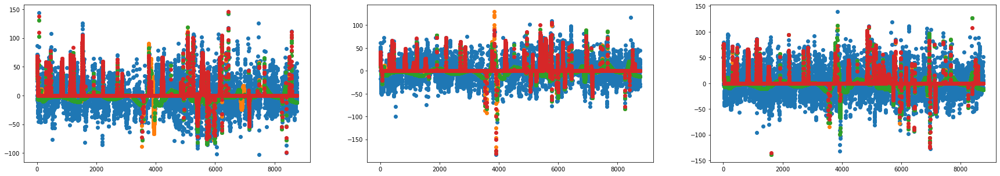

9th additional rbflayer
9th additional RBFlayer 0th epoch loss: 28.878284098274012
9th additional RBFlayer 999th epoch MSE Loss: 23.117021644959006
9th additional RBFlayer 1999th epoch MSE Loss: 21.07594368549422
9th additional RBFlayer 2999th epoch MSE Loss: 20.536567709025487
9th additional RBFlayer best loss : 20.536567709025487


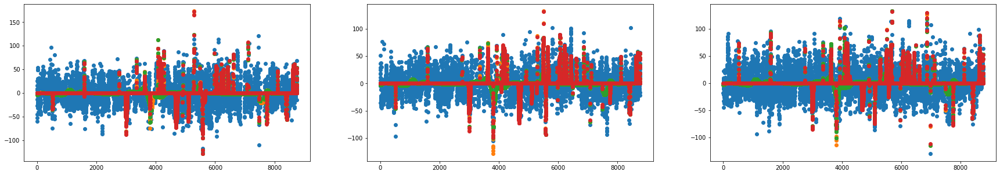

10th additional rbflayer
10th additional RBFlayer 0th epoch loss: 22.24702429998723
10th additional RBFlayer 999th epoch MSE Loss: 20.825969891188866
10th additional RBFlayer 1999th epoch MSE Loss: 20.379902045899296
10th additional RBFlayer 2999th epoch MSE Loss: 19.73313323615708
10th additional RBFlayer best loss : 19.73313323615708


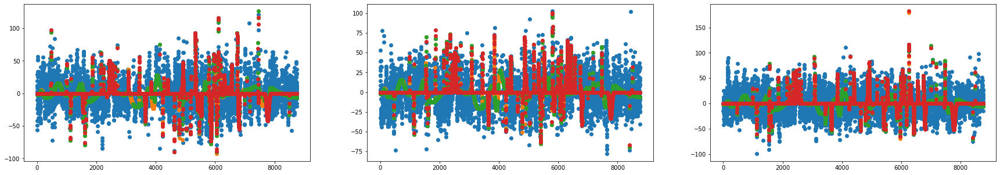

11th additional rbflayer
11th additional RBFlayer 0th epoch loss: 29.030890011970666
11th additional RBFlayer 999th epoch MSE Loss: 19.49492892319212
11th additional RBFlayer 1999th epoch MSE Loss: 18.34383058015956
11th additional RBFlayer 2999th epoch MSE Loss: 18.072985922171675
11th additional RBFlayer best loss : 17.882855079085818


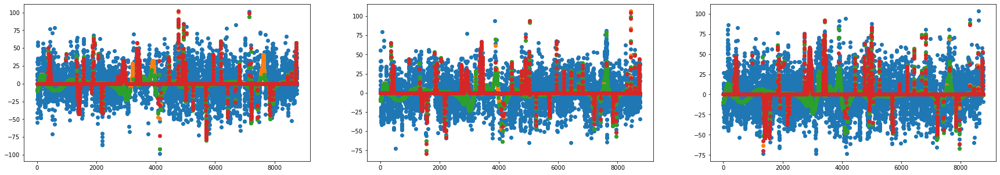

12th additional rbflayer
12th additional RBFlayer 0th epoch loss: 19.674705962021253
12th additional RBFlayer 999th epoch MSE Loss: 19.34106495600738
12th additional RBFlayer 1999th epoch MSE Loss: 16.96560481094516
12th additional RBFlayer 2999th epoch MSE Loss: 16.31363786825676
12th additional RBFlayer best loss : 16.31281596439857


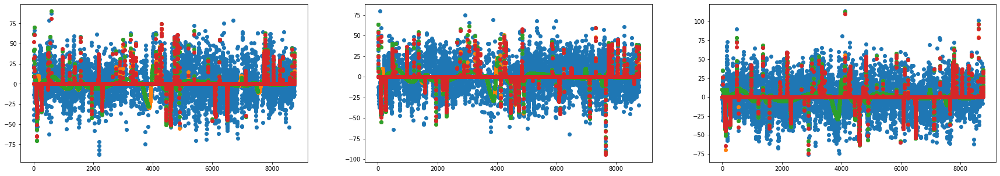

13th additional rbflayer
13th additional RBFlayer 0th epoch loss: 17.713008535533728
13th additional RBFlayer 999th epoch MSE Loss: 18.377460846357984
13th additional RBFlayer 1999th epoch MSE Loss: 16.616241381569615
13th additional RBFlayer 2999th epoch MSE Loss: 15.873170644325912
13th additional RBFlayer best loss : 15.873170644325912


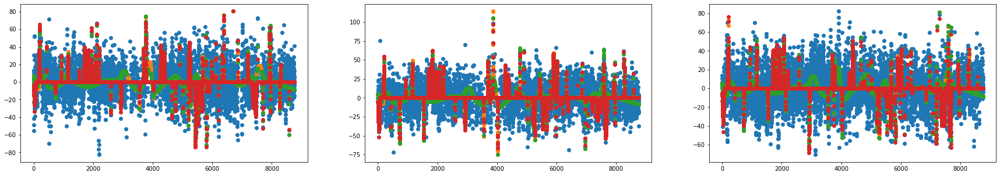

14th additional rbflayer
14th additional RBFlayer 0th epoch loss: 18.456717076779174
14th additional RBFlayer 999th epoch MSE Loss: 16.240687256681532
14th additional RBFlayer 1999th epoch MSE Loss: 14.842818054107786
14th additional RBFlayer 2999th epoch MSE Loss: 14.55768519100978
14th additional RBFlayer best loss : 14.55768519100978


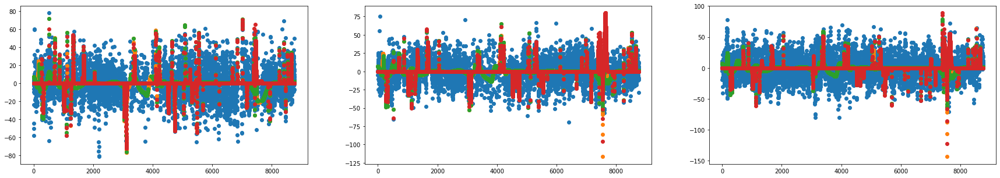

15th additional rbflayer
15th additional RBFlayer 0th epoch loss: 17.386557537694646
15th additional RBFlayer 999th epoch MSE Loss: 15.854565120599462
15th additional RBFlayer 1999th epoch MSE Loss: 14.314831669902388
15th additional RBFlayer 2999th epoch MSE Loss: 13.845572989003799
15th additional RBFlayer best loss : 13.845572989003799


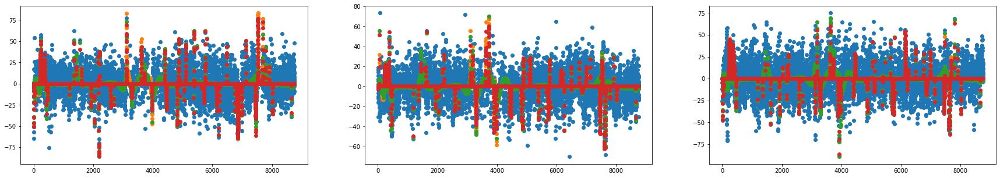

16th additional rbflayer
16th additional RBFlayer 0th epoch loss: 16.444089032986206
16th additional RBFlayer 999th epoch MSE Loss: 14.47442230365698
16th additional RBFlayer 1999th epoch MSE Loss: 13.576860711013056
16th additional RBFlayer 2999th epoch MSE Loss: 13.20138332850976
16th additional RBFlayer best loss : 13.20138332850976


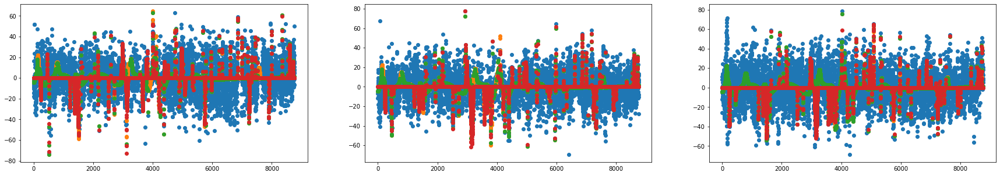

17th additional rbflayer
17th additional RBFlayer 0th epoch loss: 14.605191409583401
17th additional RBFlayer 999th epoch MSE Loss: 14.539487864307938
17th additional RBFlayer 1999th epoch MSE Loss: 12.94405253117518
17th additional RBFlayer 2999th epoch MSE Loss: 12.411899913447341
17th additional RBFlayer best loss : 12.411899913447341


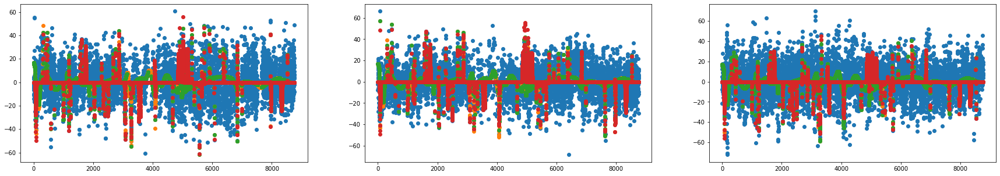

18th additional rbflayer
18th additional RBFlayer 0th epoch loss: 14.09439797401486
18th additional RBFlayer 999th epoch MSE Loss: 13.064435894515555
18th additional RBFlayer 1999th epoch MSE Loss: 11.882114838995575
18th additional RBFlayer 2999th epoch MSE Loss: 11.712764136534457
18th additional RBFlayer best loss : 11.66137556927038


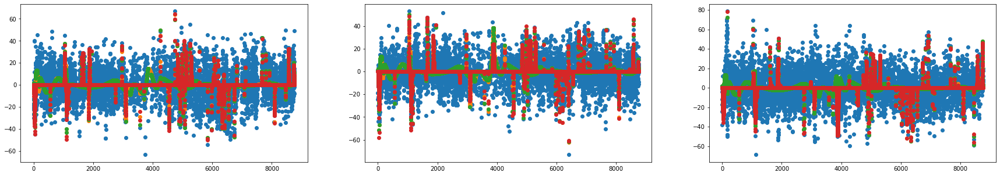

19th additional rbflayer
19th additional RBFlayer 0th epoch loss: 13.3234208654938
19th additional RBFlayer 999th epoch MSE Loss: 12.35932716622826
19th additional RBFlayer 1999th epoch MSE Loss: 11.54361189636056
19th additional RBFlayer 2999th epoch MSE Loss: 11.343504555259045
19th additional RBFlayer best loss : 11.262057992441857


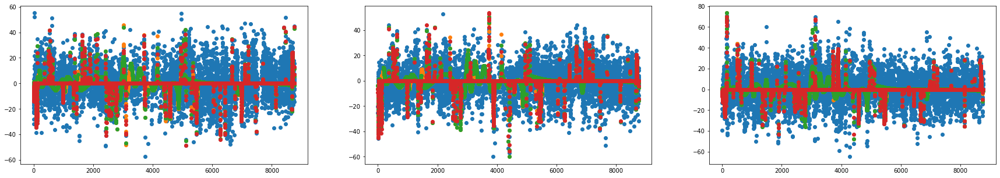

20th additional rbflayer
20th additional RBFlayer 0th epoch loss: 11.976998630198606
20th additional RBFlayer 999th epoch MSE Loss: 11.683106326718718
20th additional RBFlayer 1999th epoch MSE Loss: 10.957636501156014
20th additional RBFlayer 2999th epoch MSE Loss: 10.704824333517898
20th additional RBFlayer best loss : 10.704824333517898


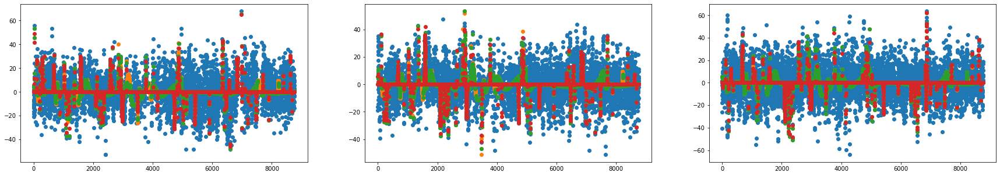

21th additional rbflayer
21th additional RBFlayer 0th epoch loss: 11.08588143479204
21th additional RBFlayer 999th epoch MSE Loss: 12.052899005408003
21th additional RBFlayer 1999th epoch MSE Loss: 10.577796090307553
21th additional RBFlayer 2999th epoch MSE Loss: 10.130988997215303
21th additional RBFlayer best loss : 10.130988997215303


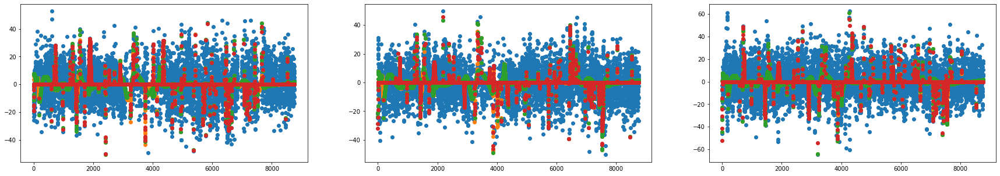

22th additional rbflayer
22th additional RBFlayer 0th epoch loss: 10.991886334314838
22th additional RBFlayer 999th epoch MSE Loss: 11.823168902941212
22th additional RBFlayer 1999th epoch MSE Loss: 10.653932098621503
22th additional RBFlayer 2999th epoch MSE Loss: 10.128425529935157
22th additional RBFlayer best loss : 10.128425529935157


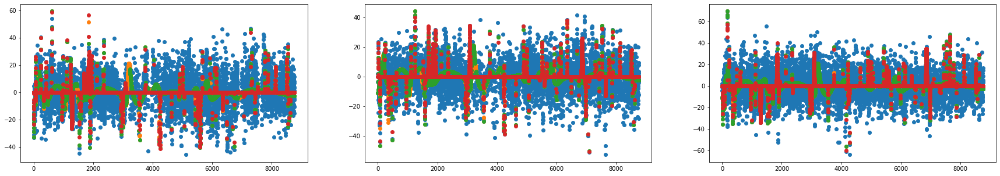

23th additional rbflayer
23th additional RBFlayer 0th epoch loss: 13.26000595473779
23th additional RBFlayer 999th epoch MSE Loss: 11.784221609170363
23th additional RBFlayer 1999th epoch MSE Loss: 10.18976228871908
23th additional RBFlayer 2999th epoch MSE Loss: 9.910261639404434
23th additional RBFlayer best loss : 9.910261639404434


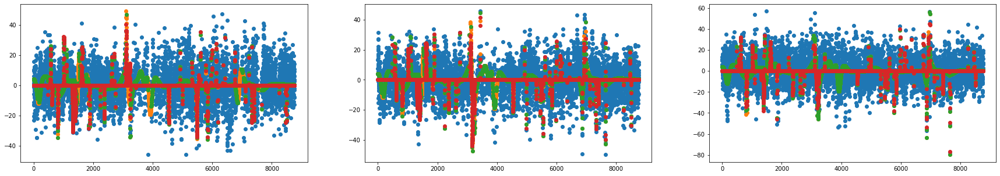

In [95]:
df = pd.read_csv("../dataset/pm25_missing.txt").drop(['datetime'], axis = 1)
df = df[df.columns[:3]].reset_index(drop=True)
target = torch.tensor(df.values).T.to(device).reshape(3,len(df))
input = torch.tensor(df.index + 1, dtype=float).to(device)
model2 = MultiRBFnnTime(3, 100, device)
model2.train(input, target, 3000, 1e-2, 10, 3, 0.0)

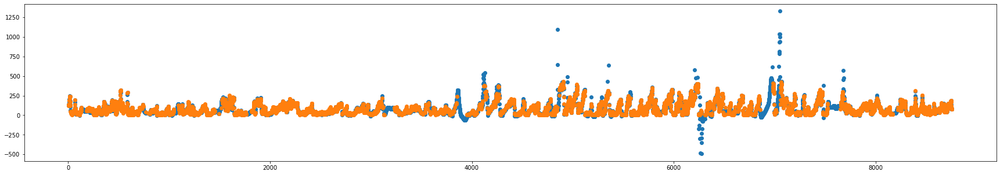

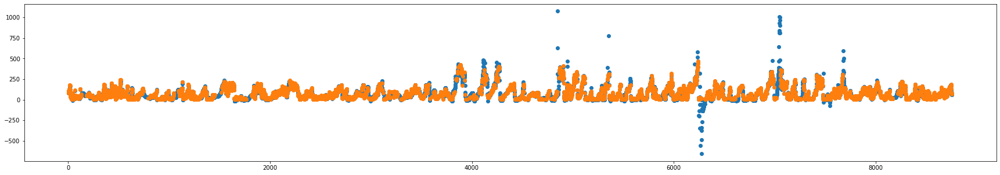

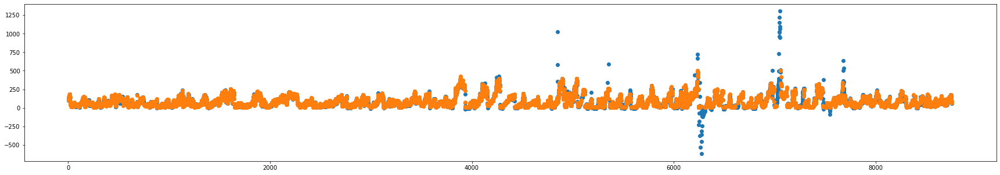

In [110]:
pred_ = model2.pred(input)[1]
missing_index = torch.where(target.isnan(), 0.0, 1.0)
for i in range(3):
    plt.figure(figsize=(30,5))
    plt.scatter(input.cpu().detach().numpy(), pred_[i].cpu().detach().numpy())
    plt.scatter(input[missing_index[i] != 0].cpu().detach().numpy(), target[i][missing_index[i] != 0].cpu().detach().numpy())
    # plt.scatter(input[missing_index[i] != 1].cpu().detach().numpy(), pred_[i][missing_index[i] != 1].cpu().detach().numpy())

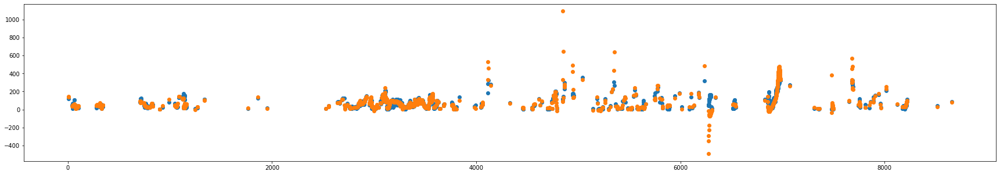

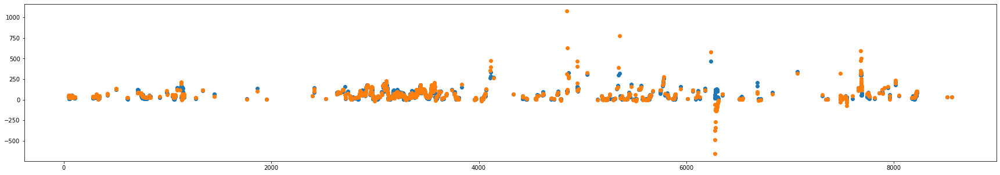

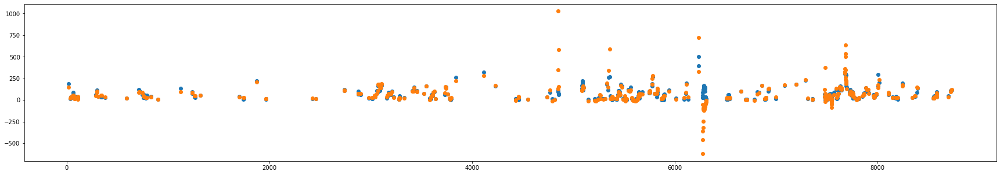

In [99]:
real = pd.read_csv("./dataset/pm25_ground.txt").drop(['datetime'], axis = 1)
real = real[real.columns[:3]].reset_index(drop=True)
real_target = torch.tensor(real.values).T.to(device).reshape(3,len(real))
real_missing = torch.where(real_target.isnan(), 0.0, 1.0)
a = missing_index - real_missing
for i in range(3):
    plt.figure(figsize=(30,5))
    plt.scatter(input[a[i] != 0].cpu().detach().numpy(), real_target[i][a[i] != 0].cpu().detach().numpy())
    plt.scatter(input[a[i] != 0].cpu().detach().numpy(), pred_[i][a[i] != 0].cpu().detach().numpy())

In [98]:
torch.mean(torch.abs(real_target[a != 0] - pred_[a != 0]))

tensor(28.5305, device='cuda:0', dtype=torch.float64)

In [102]:
out = torch.exp(-1*(torch.pow((input - model2.done_MC), 2)) / (2 * torch.pow(model2.done_MS, 2)))
pred = torch.mm(model2.done_MW, out)

In [107]:
out2 = torch.exp(-1*(torch.pow((input - model2.done_centers), 2)) / (2 * torch.pow(model2.done_sigma, 2)))
pred2 = torch.mm(model2.done_weights, out2)

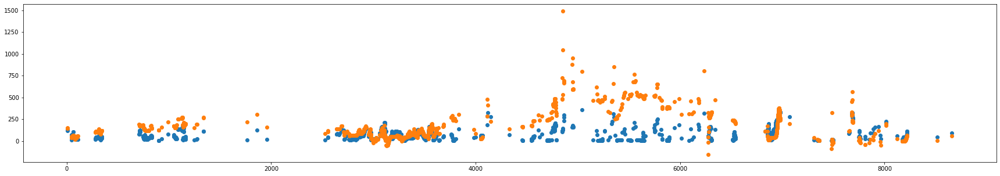

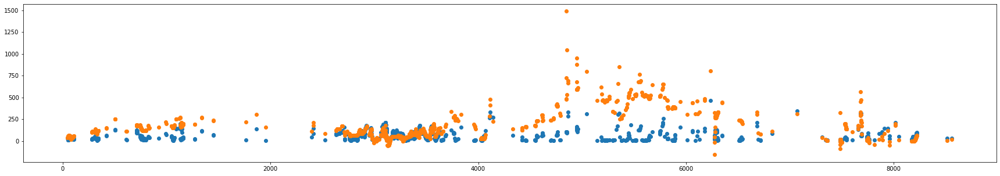

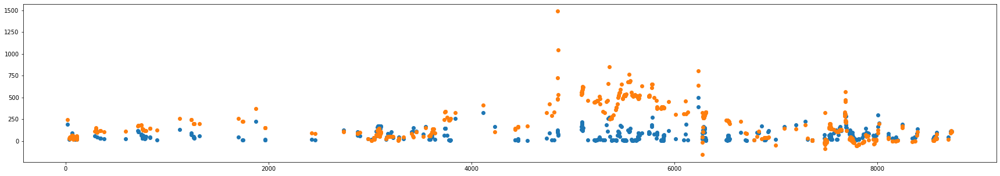

In [108]:
real = pd.read_csv("./dataset/pm25_ground.txt").drop(['datetime'], axis = 1)
real = real[real.columns[:3]].reset_index(drop=True)
real_target = torch.tensor(real.values).T.to(device).reshape(3,len(real))
real_missing = torch.where(real_target.isnan(), 0.0, 1.0)
a = missing_index - real_missing
for i in range(3):
    plt.figure(figsize=(30,5))
    plt.scatter(input[a[i] != 0].cpu().detach().numpy(), real_target[i][a[i] != 0].cpu().detach().numpy())
    plt.scatter(input[a[i] != 0].cpu().detach().numpy(), pred2[0][a[i] != 0].cpu().detach().numpy())

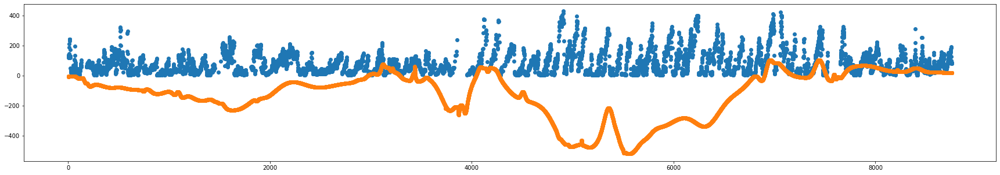

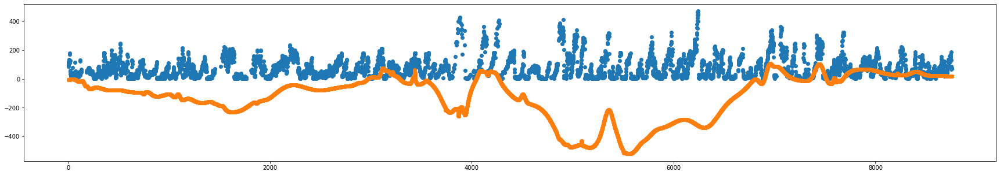

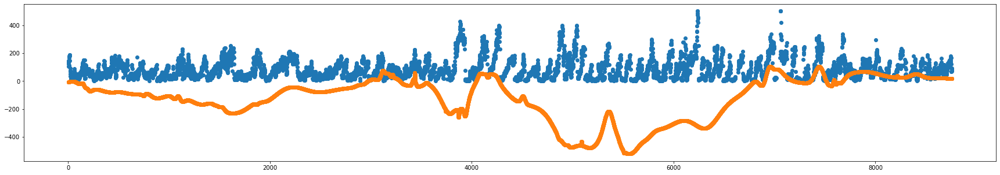

In [109]:
real = pd.read_csv("./dataset/pm25_ground.txt").drop(['datetime'], axis = 1)
real = real[real.columns[:3]].reset_index(drop=True)
real_target = torch.tensor(real.values).T.to(device).reshape(3,len(real))
real_missing = torch.where(real_target.isnan(), 0.0, 1.0)
a = missing_index - real_missing
for i in range(3):
    plt.figure(figsize=(30,5))
    plt.scatter(input[a[i] != 1].cpu().detach().numpy(), real_target[i][a[i] != 1].cpu().detach().numpy())
    plt.scatter(input[a[i] != 1].cpu().detach().numpy(), pred[0][a[i] != 1].cpu().detach().numpy())

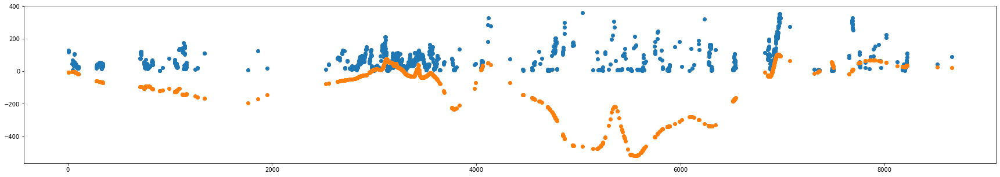

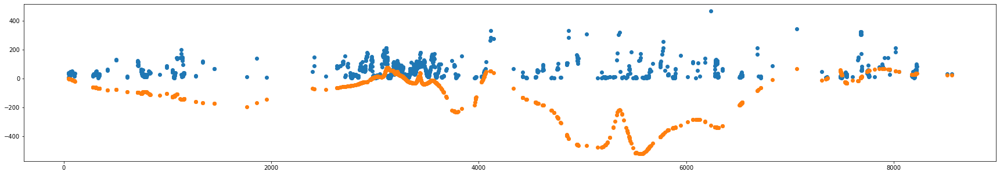

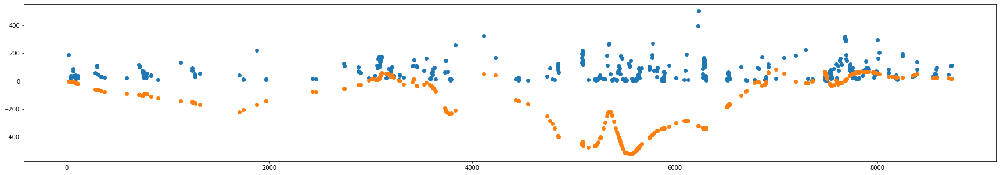

In [105]:
real = pd.read_csv("./dataset/pm25_ground.txt").drop(['datetime'], axis = 1)
real = real[real.columns[:3]].reset_index(drop=True)
real_target = torch.tensor(real.values).T.to(device).reshape(3,len(real))
real_missing = torch.where(real_target.isnan(), 0.0, 1.0)
a = missing_index - real_missing
for i in range(3):
    plt.figure(figsize=(30,5))
    plt.scatter(input[a[i] != 0].cpu().detach().numpy(), real_target[i][a[i] != 0].cpu().detach().numpy())
    plt.scatter(input[a[i] != 0].cpu().detach().numpy(), pred[0][a[i] != 0].cpu().detach().numpy())